#Install Torch and Import Main Libraries

In [ ]:
!pip3 install torch 
!pip3 install torchvision
!pip3 install tqdm
# !pip install plotly --upgrade

In [ ]:
# import necessary libraries
import os

# For PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch import autograd
from torchvision import transforms, utils, datasets
from torch.nn.parameter import Parameter

# Numpy
import numpy as np

# Pandas
import pandas as pd

# Plotting
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Plotly for interactive plots
# import plotly.plotly as pty
# import plotly.graph_objs as go
# import plotly
# plotly.tools.set_credentials_file(username='bs5', api_key='K11qos5rMPRnQo9SMzlN')

from tqdm import tqdm # for showing progress bar
import random
import pdb # for debugging

from collections import Counter

# Make sure GPU available
assert torch.cuda.is_available() # You need to request a GPU from Runtime > Change Runtime Type

# import functions for precision, recall, f1
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, fbeta_score, confusion_matrix

from statistics import mean

import warnings

import array

import datetime

# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

## Use this function if you want to double the sample size with samples with added noise
def AugmentData(data):
  random_num = np.random.normal(0, 0.01, size=data.shape[0]) # create a normal distribution of random numbers (mostly within 0.04 of zero) 
  more_data = data
  more_data[:,2] = more_data[:,2] + random_num # add those random numbers to each angle point of the men's data
  augmented_data = np.concatenate((data, more_data)) # return a data array with double the amount of men's data, which is slightly adjusted 
  
  return augmented_data

## Use this function if you want to double the MALE sample size with samples with added noise
def AugmentMaleData(data):
  indices = np.where(data[:,4]==1) # find the indices where the men are (returns a tuple where the [0] dimension is what we want)
  random_num = np.random.normal(0, 0.01, size=indices[0].shape[0]) # create a normal distribution of random numbers (mostly within 0.04 of zero) 
  more_data = data[indices[0],:]
  more_data[:,2] = more_data[:,2] + random_num # add those random numbers to each angle point of the men's data
  random_num2 = np.random.normal(0, 0.01, size=indices[0].shape[0]) # create a normal distribution of random numbers (mostly within 0.04 of zero) 
  more_data2 = data[indices[0],:]
  more_data2[:,2] = more_data2[:,2] + random_num # add those random numbers to each angle point of the men's data
  div = 2
  more_data2 = more_data2[0:int(len(more_data2)/div),:]
  augmented_data = np.concatenate((data, more_data,more_data2)) # return a data array with double the amount of men's data, which is slightly adjusted 
  
  return augmented_data

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


#Import and Clean Data/Declare Functions

In [ ]:
# Import massive raw time series data; make sure Day number is included in data
# 400000 x 12
# raw_data1 = pd.read_csv('day1_updated_types.csv')

# with open('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/foo.txt', 'w') as f:
#   f.write('Hello Google Drive!')
# !cat /content/gdrive/My\ Drive/z\ Misc/foo.txt
# print('\n')
# OR
# !cat '/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/foo.txt'

# Angle reading level data
raw_data1 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day1_prec.csv',header=None) # Bryan's Drive
raw_data2 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day2_prec_rev1.csv',header=None) # Bryan's Drive
raw_data3 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day3_prec_rev1.csv',header=None) # Bryan's Drive
raw_data4 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day4_prec_rev1.csv',header=None) # Bryan's Drive

# Stroke level data
# raw_data1 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day1_strokes.csv',header=None) # Bryan's Drive
# raw_data2 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day2_strokes.csv',header=None) # Bryan's Drive
# raw_data3 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day3_strokes.csv',header=None) # Bryan's Drive
# raw_data4 = pd.read_csv('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day4_strokes.csv',header=None) # Bryan's Drive

# raw_data1 = pd.read_csv('/content/gdrive/My Drive/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day1_prec.csv',header=None) # Danny's drive
# raw_data2 = pd.read_csv('/content/gdrive/My Drive/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day2_prec_rev1.csv',header=None) # Danny's drive
# raw_data3 = pd.read_csv('/content/gdrive/My Drive/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day3_prec_rev1.csv',header=None) # Danny's drive
# raw_data4 = pd.read_csv('/content/gdrive/My Drive/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/day4_prec_rev1.csv',header=None) # Danny's drive

print('import complete')

# Columns for Angle Dataset
# 0 time % Seconds *************
# 1 dt   % Milliseconds ****************
# 2 xAngle % Not needed
# 3 yAngle % Main Data ****************
# 4 zAngle % Not needed
# 5 stroke 
# 6 minAngle 
# 7 maxAngle 
# 8 userNum  
# 9 timeStamp
# 10 segNumFromData ****************
# 11 type ********************

# Columns for Stroke Dataset
# 0 time % Seconds *************
# 1 Half Stroke Period
# 2 Zeros
# 3 Half Stroke Amplitude ****************
# 4 Zeros
# 5 Zeros 
# 6 Zeros 
# 7 Zeros 
# 8 Zeros  
# 9 Zeros
# 10 segNumFromData ****************
# 11 type ********************


# print(type(raw_data1))
# print(raw_data1.shape)

# plot_data = True
# if plot_data:
#   plt.plot(raw_data1[:,0],raw_data1[:,3])
#   plt.show()

###############################
######## Prepare Angle Data #########
###############################

raw_data_clean = pd.concat([raw_data1[raw_data1.iloc[:,10] != 0], raw_data2[raw_data2.iloc[:,10] != 0], raw_data3[raw_data3.iloc[:,10] != 0], raw_data4[raw_data4.iloc[:,10] != 0]])
# raw_data_jinja = pd.concat([raw_data1[raw_data1.iloc[:,10] != 0], raw_data2[raw_data2.iloc[:,10] != 0]])
# raw_data_gulu = pd.concat([raw_data3[raw_data3.iloc[:,10] != 0], raw_data4[raw_data4.iloc[:,10] != 0]])

# raw_data_clean = raw_data1[raw_data1.iloc[:,10] != 0]
raw_data_clean = raw_data_clean.values # convert to numpy
# raw_data_jinja = raw_data_jinja.values
# raw_data_gulu = raw_data_gulu.values
m , n = raw_data_clean.shape # get only needed columns
# m , n = raw_data_jinja.shape # get only needed columns
# m , n = raw_data_gulu.shape # get only needed columns
data = np.zeros((m,5),dtype=float)
data[:,0] = raw_data_clean[:,10] # New User Number
data[:,1] = raw_data_clean[:,0]/1000  # Time in seconds
data[:,2] = raw_data_clean[:,3]  # Angle (for angle model)/Half Stoke Amplitude (for stroke model)
data[:,3] = raw_data_clean[:,1]  # dt (because sampling isn't a consistent 25 Hz)/ Half Stroke Period
data[:,4] = raw_data_clean[:,11] # Type

# data[:,0] = raw_data_jinja[:,10] # New User Number
# data[:,1] = raw_data_jinja[:,0]/1000  # Time in seconds
# data[:,2] = raw_data_jinja[:,3]  # Angle (for angle model)/Half Stoke Amplitude (for stroke model)
# data[:,3] = raw_data_jinja[:,1]  # dt (because sampling isn't a consistent 25 Hz)/ Half Stroke Period
# data[:,4] = raw_data_jinja[:,11] # Type

# data[:,0] = raw_data_gulu[:,10] # New User Number
# data[:,1] = raw_data_gulu[:,0]/1000  # Time in seconds
# data[:,2] = raw_data_gulu[:,3]  # Angle (for angle model)/Half Stoke Amplitude (for stroke model)
# data[:,3] = raw_data_gulu[:,1]  # dt (because sampling isn't a consistent 25 Hz)/ Half Stroke Period
# data[:,4] = raw_data_gulu[:,11] # Type

num_users_original = np.size(np.unique(data[:,0]))
print("Original number of users:", num_users_original)

# remove bad users with drifty data or other weird anomalies
users_to_remove = [14,	16,	2058,	2115,	2116,	2117,	2118,	2119,	2164,	2165,	2253,	2254,	3048,	3061,	3062,	3064,	3067,	3068,	3070,	3075,	3076,	3077,	3079,	3080,	3088,	3093,	3099,	3103,	3104,	3108,	3111,	3113,	3114,	3117,	3118,	3119,	3123,	3124,	3146,	3165,	3167,	3168,	3174,	3175,	3193,	3232,	3237,	3238,	3245,	3246,	3248,	3255,	3450,	3453,	3454,	3457,	3459,	3461,	3464,	3466,	3467,	3472]
num_bad_users = len(users_to_remove)
print("Bad number of users:", num_bad_users)
for i in range(num_bad_users):
  data = data[np.logical_not(data[:,0] == users_to_remove[i])]

# print final number of users
num_users_modified = np.size(np.unique(data[:,0]))
print("Final number of users:", num_users_modified)
print("Max user:",data[-1,0])

delta = [] # represents the difference in angle between time steps
garbage = [] # represents the data points where no pumping is happening

## use to remove any non-pumping data
for i in range(len(data)-1): 
  delta.append(data[i,2]-data[i+1,2])
  if abs(delta[i]) < 0.01:  # 0.01 was chosen by looking at deltas and finding that some were as low as 0.05, but most were around 1
    garbage.append(i)
print("Number of pumping segments:",len(data))
print("Number of non-pumping segments: ",len(garbage))

# print(data.shape)
data = np.delete(data, garbage, 0) # this removes all the rows corresponding to those recorded in "garbage"
print("Reduced data length: ",data.shape)

# combine W/C groups
combine_WC = False
if combine_WC:
  # data(:,4) is where the type is defined
  # in the 4th column, need to change all the 3's to 2'ss
  data[:,4][data[:,4] == 3] = 2

to_augment = False
if to_augment:
  print("Before overall augmenting: ", data.shape)
  # data = AugmentData(data)
  # print("After overall augmenting: ", data.shape)
  data = AugmentMaleData(data)
  data = AugmentMaleData(data)
  # data = AugmentMaleData(data)
  print("After male augmenting: ", data.shape)

# remove users of a specific type
to_remove_users = False
if to_remove_users:
  type_to_remove = 3 # 1=M, 2=W, 3=C
  data = data[np.logical_not(data[:,4] == type_to_remove)]

# print(type(data[0,1]))
# print(data[0:10,1])

# print(data.shape)

# plot_data = True
# if plot_data:
#   plt.plot(data[:,1],data[:,3])
#   plt.show()




import complete
Original number of users: 1181
Bad number of users: 62
Final number of users: 1119
Max user: 3478.0
Number of pumping segments: 2192007
Number of non-pumping segments:  256043
Reduced data length:  (1935964, 5)


In [ ]:
# Save cleaned up data
# data_all_export = np.savetxt('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Data Analysis/Raw Data/DataFiles/data_all.csv',data,delimiter=',')

In [ ]:
################################################################################
################# Create Angle Dataset class ###################################
################################################################################

class AngleDataset(Dataset):
  def __init__(self, data_in, indices, chunk_len):
    super(AngleDataset, self).__init__()
    
    self.data_out, self.label_out = self.process_data(data_in, indices, chunk_len)
    
  def __getitem__(self,i):
    x = self.data_out[i]
    y = self.label_out[i]
#     return x, y.float() # Use for MSELoss
    return x, y
    
  def __len__(self):
    return len(self.label_out)
  
  def process_data(self, data, index, chunk_length):
    # chunk_length is a class input; Arbitrary, but there are between about 15-25 samples per second
    big_jump = []
    
    # data augmentation options: Start with 1 horiz_sampling and then increase from there if needed
    horiz_samplings = 1 # number of times to sample horizontally from the same dataset
    # vert_samplings = 0 # number of vertical samplings; No longer needed due to normalization
    # vert_shift = 3 # degrees of shift when augmenting the data; No longer needed due to normalization

    data_out_m = np.zeros((1,chunk_length,3),dtype=float) # Initialize master data out (x)
    labels_m = np.zeros((1,1),dtype=int)# Initialize labels out (y)

    # Create a for loop that gets the data for one user then does all the magic for it:
    for i in index:
      #   print('User:',i)
      single_user = data[np.where(data[:,0] == i)] # get the data for one user

      len_user, cc = single_user.shape
      #   print(len_user)
      if len_user <= chunk_length: # skip users whose total lengths are less than the chunk length
        continue # go to the next iteration

      # SKIP FOR NOW: Clean up data by removing leading and ending portions with no change
      #       single_user = single_user # Will assign the cleaned up data here

      # Calculate total pump time of user for use later as second channel
      duration_seconds = single_user[-1,1] - single_user[0,1]
      duration_ind, skip = single_user.shape
      #   print(duration)
      #   print(duration_ind)

      num_chunks = int(duration_ind/chunk_length) # Starting from beginning of array, get chunks of size chunk_length
      #   print(num_chunks)

      # Create and combine chunks
      new_chunks = np.zeros([1, chunk_length, 2],dtype=float) # initialize array for concatenation in the loop
      for j in range(num_chunks):
        new_chunk = single_user[np.newaxis,0+j*chunk_length:chunk_length+j*chunk_length, 2:4]
        new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0
        new_chunks = np.vstack((new_chunks, new_chunk))
      #     print(new_chunk.shape)
      new_chunks = np.delete(new_chunks, 0, 0) # delete initialization row
      #   print('new',new_chunk.shape)

      # Also augment by getting random chunks
      random_sets = 6 # changed from 3 to 10 for only Day 1 data; improved acc from 50% to 100%
      for j in range(random_sets * num_chunks):
        start_ind = np.random.randint(0,duration_ind - chunk_length)
        new_chunk = single_user[np.newaxis, start_ind:start_ind + chunk_length, 2:4]
        new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0
        
        # this loop removes any chunks with large (>65 degree) jumps 
        for k in range(new_chunk.shape[0]):
#           counter_chunks += 1
          if max(new_chunk[k, :, 0]) - min(new_chunk[k, :, 0]) < 65:
#             counter_recorded += 1
#             big_jump.append(new_chunk[k, :, 0]) # each chunk, all the angle data
            new_chunks = np.vstack((new_chunks, new_chunk))
        
#       for i in range(min(len(big_jump), 10)):
#         plt.plot(big_jump[i])
#         plt.show()
      
      # Augment by shifting vertically (DO NOT DO THIS; REPLACED WITH NORMALIZING above)

      # Augment by adding drift based on some condition to make sure we don't add drift to segments that already have drift
#       slope_samplings = 0 # number of slope augmentations
#       slopes = [-1, 1]

      # Combine data
      current_num_chunks, a, b = new_chunks.shape
      dur_array = np.full((current_num_chunks, chunk_length, 1), duration_seconds) # creating channel for the duration
      new_chunks = np.concatenate((new_chunks,dur_array), axis = 2) # Concatenate on the duration channel
      data_out_m = np.vstack((data_out_m, new_chunks )) # concatenate on all chunks from that user
    #   print(data_out_m.shape)
#   Decide which users to compare
#       for t in range(single_user.shape[0]):
#         if single_user[t,4] == 3:
#           single_user[t,4] = 2

      # create labels
      labels_m = np.vstack((labels_m, np.full((current_num_chunks, 1), single_user[0,4])))

    data_out_m = np.delete(data_out_m, 0, 0) # delete initialization row
    labels_out_m = np.delete(labels_m,0,0) # delete initialization row
    labels_out_m = labels_out_m - min(labels_out_m) # reassign M/W/C to [0, 1, 2] so I can use cross entropy loss

    # Normalize data for better gradients
    # Normalizing params: We want to choose these such that after dividing the original values by this, we get a value between -1 and 1 or 0 and 1 (on the 1 scale)
    amp_norm = 30 # 30 was chosen because we want the max value of this to be approx. 1 and the max amplitude is 60 degrees and half of that is 30;
    dt_norm = 80 # The max dt is about 80 ms
    dur_norm = 600 # the max duration is about 600 seconds

    data_out_m[:,:,0] = data_out_m[:,:,0]/amp_norm
    data_out_m[:,:,1] = data_out_m[:,:,1]/dt_norm
    data_out_m[:,:,2] = data_out_m[:,:,2]/dur_norm
#     print('Data size = ',data_out_m.shape)
#     print('Classification size = ',labels_out_m.shape)
#     print('Mean of all amplitudes (should be ~0 if normalization worked) = ', np.mean(data_out_m[:,:,0]))
    
    # convert final data from numpy arrays to tensors
    data_out_m = torch.Tensor(data_out_m)
    labels_out_m = torch.Tensor(labels_out_m).long()
#     print("data type = ", data_out_m.type())
#     print("label type = ", labels_out_m.type())
    data_out_m = data_out_m.permute(0, 2, 1)
#     print("permuted = ", data_out_m[:,0:2,:].size())


# Output: x, y tuple; x = Data arrays of chunks (i.e. 600 users *~10 chunks/user) x 100(chunk len)x3 (angle, dt, duration) arrays; y = labels = Separate array/list of 600 (users) x 1 (User Type)   
    return data_out_m[:,0:2,:], labels_out_m # x, y ; x = 5000 x 100 x 3 ; y = 5000 x 1

################################################################################
################# Create Accuracy and Plotting functions #######################
################################################################################

def getValidationAcc(valid_loader_f, model_f, objective_f):
  accuracies_val_int = []
  losses_val_int = []
  for x_val, y_truth_val in valid_loader_f:
#     model_f.eval() # switches the model into evaluate mode (where it doesn't use Dropout, for example)
    x_val, y_truth_val = x_val.cuda(async=True), y_truth_val.cuda(async=True)

    x_val.requires_grad = False

    y_hat_val = model_f(x_val)

    loss_val_batch = np.mean(objective_f(y_hat_val, y_truth_val.squeeze(1)).item()) #maybe also .item() 
    losses_val_int.append(loss_val_batch)
    
    acc_val_batch = (torch.softmax(y_hat_val, 1).argmax(1).unsqueeze(1) == y_truth_val).float().mean().cpu().numpy()
    accuracies_val_int.append(acc_val_batch)
  
  losses_val = np.mean(losses_val_int)
  accuracies_val = np.mean(accuracies_val_int)
  
  return losses_val, accuracies_val  

def plot_all(Losses, Accuracy, Losses_v, Accuracy_v):
  d, e = zip(*Losses_v) 
  x_axis = list(range(len(Losses)))# * save_every
  # x_axis = x_axis * save_every

  ave_interval = 50

  new_length = int(len(Losses)/ave_interval)
  new_loss = np.zeros(new_length)
  new_x = np.zeros(new_length)

  for i in range(new_length):
    new_loss[i] = np.mean(np.asarray(Losses)[i*ave_interval:(i+1)*ave_interval])
    new_x[i] = x_axis[(i)*ave_interval]

  new_length_acc = int(len(Accuracy)/ave_interval)
  new_acc = np.zeros(new_length_acc)
  new_x_acc = np.zeros(new_length_acc)
  old_x_acc = list(range(len(Accuracy)))

  for i in range(new_length_acc):
    new_acc[i] = np.mean(Accuracy[i*ave_interval:(i+1)*ave_interval])
    new_x_acc[i] = old_x_acc[(i)*ave_interval]

  plt.plot(new_x,new_loss, label='Train')
  plt.plot(d, e, label='Validation')
  plt.title('Cross Entropy Loss During Training :'+str(top)+'-'+str(iterate+1))
  plt.xlabel('Iteration (x '+str(save_every)+')')
  plt.ylabel('Loss')
  plt.legend()
  plt.savefig('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/Loss-'+str(top)+'-'+str(iterate+1)+'.pdf')
  plt.show()
  plt.close() 

  # Plot the accuracy
  a, b = zip(*Accuracy_v)
  plt.plot(new_x_acc,new_acc, label='Train')
  plt.plot(a, b, label='Validation')
  plt.xlabel('Iteration (x '+str(save_every)+')')
  plt.ylabel('Accuracy (Fraction)')
  plt.title('Accuracy of Predicted Values :'+str(top)+'-'+str(iterate+1))
  plt.legend()
  plt.savefig('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/Acc-'+str(top)+'-'+str(iterate+1)+'.pdf')
  plt.show()
  plt.close() 

################################################################################
####### Create Counting parameters and misclassification functions #############
################################################################################

def count_parameters(model):
  total_param = 0
  for name, param in model.named_parameters():
      if param.requires_grad:
          num_param = np.prod(param.size())
          if param.dim() > 1:
              print(name, ':', 'x'.join(str(x) for x in list(param.size())), '=', num_param)
          else:
              print(name, ':', num_param)
          total_param += num_param
  print("Total # of parameters: ",total_param)
  print(total_param)
  print(total_param, file = results)
  return total_param

def quantify_misclassification(model):
  ## This cell will gather the predictions of a trained model and allow you to visualize those which were misclassified
  model = model.cuda()
  # initialize a number of lists
  accuracy_vis = [] 
  accuracy_scikit_list = []
  precision_scikit_list = []
  recall_scikit_list = []
  f1_scikit_list = []
  conf_matrix_total = np.array([[0,0,0],[0,0,0],[0,0,0]], np.int32)
  batches = 0
  control = torch.tensor([[0],[1],[2]])
  conf_matrix_adj = np.array([[1,0,0],[0,1,0],[0,0,1]], np.int32) # Used to adjust confusion matrix

  
  bad_x = [] # list the inputs (angle data) of a misclassified chunk
  user_title = [] # Tie the user type back to the data
  all_user_title = [] # list all the user types

  user_type = ['Male', 'Female', 'Child']
#   user_type = ['Male', 'Female']
#   user_type = ['Female', 'Child']
  loader = valid_loader

  for chunk_num, (x_vis, y_truth_vis) in enumerate(loader):
    x_vis, y_truth_vis = x_vis.cuda(), y_truth_vis.cuda()
    y_hat_vis = model(x_vis)
    y_hat_vis_type = torch.softmax(y_hat_vis, 1).argmax(1).unsqueeze(1)
    acc_vis = (y_hat_vis_type == y_truth_vis).float()
    location = []
    accuracy_scikit = accuracy_score(y_truth_vis.cpu(),y_hat_vis_type.cpu())
    precision_scikit = precision_score(y_truth_vis.cpu(),y_hat_vis_type.cpu(),average = 'macro')
    recall_scikit = recall_score(y_truth_vis.cpu(),y_hat_vis_type.cpu(),average = 'macro')
    f1_score_scikit = f1_score(y_truth_vis.cpu(),y_hat_vis_type.cpu(),average = 'macro')

    for k in range(acc_vis.size(0)):
      all_user_title.append(user_type[np.int(y_truth_vis[k])])

      if np.int(acc_vis[[k]])== 0: # if misclassifed
        location.append(k) # record locations within batch
        bad_x.append(x_vis[k, 0, :]) # pull out data related to misclassified chunks
        user_title.append(user_type[np.int(y_truth_vis[k])]) # collect correct classification for misclassified chunks 

    accuracy_vis.append(acc_vis.mean().item())
    accuracy_scikit_list.append(accuracy_scikit)
    precision_scikit_list.append(precision_scikit)
    recall_scikit_list.append(recall_scikit)
    f1_scikit_list.append(f1_score_scikit)    

    conf_matrix_total = conf_matrix_total + confusion_matrix(torch.cat((y_truth_vis.cpu(), control),0),torch.cat((y_hat_vis_type.cpu(), control),0)) - conf_matrix_adj # Ensures that all groups are represented but then adjusts them back to original values
    
  # counts = Counter(user_title)
  # all_counts = Counter(all_user_title) # count number of each user type

  # print("Accuracy (manual)")
  # print(mean(accuracy_vis))
  print(mean(accuracy_scikit_list))
  print(mean(precision_scikit_list))
  print(mean(recall_scikit_list))
  print(mean(f1_scikit_list))

  print(mean(accuracy_scikit_list),  file = results)
  print(mean(precision_scikit_list), file = results)
  print(mean(recall_scikit_list),    file = results)
  print(mean(f1_scikit_list),        file = results)

  # print(conf_matrix_total) # Entire confusion matrix
  for i in range(3):
    for j in range(3):
      print(conf_matrix_total[i,j])
      print(conf_matrix_total[i,j], file = results)
  print(conf_matrix_total.sum())
  print(conf_matrix_total.sum(), file = results)

#Network Topology

## Small Conv Network

In [ ]:
class SmallConvNetwork(nn.Module):
  def __init__(self, dataset, topology):
    super(SmallConvNetwork, self).__init__()
    
    output = 3 # number of options for classification for using Cross Entropy Loss
#     print(dataset.data_out.size())
    A = dataset.data_out.size(1) # number of channels of input data
    B = 8
    C = B*2 # 16
    D = C*2 # 32
    E = D*2 # 64
    F = E*2 # 128
    G = F*2 # 256
    H = G*2 # 512
    neg_slope = 0.01
    ks1 = 3 # was 4 # these need to be greater than 1 to take advantage of the convolutions; otherwise it is just like doing a linear layer
    ks2 = 3 # was 4
    ks3 = 3
    # Activation functions: nn.ReLU()  nn.SELU()  nn.Tanh()  nn.LeakyReLU(negative_slope=neg_slope)

# All Layers, No Dropout
    if (topology == 1):
      # Layers A-B
      size_in = 784 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
      )    
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 2):
      # Layers A-C
      size_in = 1536 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 3):
      # Layers A-D
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 4):
      # Layers A-E
      size_in = 6144
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 5):
      # Layers A-F
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 
      
    elif (topology == 6):
      # Layers A-G
      size_in = 24576
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )    

    elif (topology == 7):
      # Layers A-H
      size_in = 49152
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(G,H, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 
# All Layers, w/Dropout after Layer 1
    if (topology == 8):
      # Layers A-B w/Dropout after Layer 1
      size_in = 784 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )    
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 9):
      # Layers A-C  w/Dropout after Layer 1
      size_in = 1536 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 10):
      # Layers A-D w/Dropout after Layer 1
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 11):
      # Layers A-E w/Dropout after Layer 1
      size_in = 6144
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 12):
      # Layers A-F w/Dropout after Layer 1
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 
      
    elif (topology == 13):
      # Layers A-G w/Dropout after Layer 1
      size_in = 24576
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )    

    elif (topology == 14):
      # Layers A-H w/Dropout after Layer 1
      size_in = 49152
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(G,H, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 
# All Layers, w/Dropout (p=0.15) after all conv layers
    if (topology == 15):
      # Layers A-B w/Dropout after all Conv Layers (but with p = 0.15) ***Based on info from https://stats.stackexchange.com/questions/240305/where-should-i-place-dropout-layers-in-a-neural-network and http://mipal.snu.ac.kr/images/1/16/Dropout_ACCV2016.pdf
      size_in = 784 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )    
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 16):
      # Layers A-C  w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 1536 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 17):
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 18):
      # Layers A-E w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 6144
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 19):
      # Layers A-F w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 
      
    elif (topology == 20):
      # Layers A-G w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 24576
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )    

    elif (topology == 21):
      # Layers A-H w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 49152
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(G,H, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 
# All Layers, w/Dropout (p=0.25) after all conv layers
    if (topology == 22):
      size_in = 784 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )    
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 23):
      size_in = 1536 
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, output),
      )

    elif (topology == 24):
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 25):
      size_in = 6144
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

    elif (topology == 26):
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 
      
    elif (topology == 27):
      size_in = 24576
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )    

    elif (topology == 28):
      size_in = 49152
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(G,H, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      ) 

################################################################################
########################## Random other explorations ###########################
################################################################################

# Layers A-F w/Dropout (p=0.25) after Layers CD and EF; SELU
    elif (topology == 29):
      size_in = 6144
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.SELU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.SELU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.SELU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.SELU(),
#         nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=2, padding=1),
        nn.SELU(),
        nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

# Layers A-F; Size 30 FC layer; 1 Dropout (p=0.30) after FC layer 
    elif (topology == 30):
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, 30),
        nn.ReLU(),
        nn.Dropout(p=0.30),
        nn.Linear(30, output),
      )

# Layers A-F; Size 30 FC layer; 1 Dropout (p=0.50) after FC layer 
    elif (topology == 31):
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, 30),
        nn.ReLU(),
        nn.Dropout(p=0.50),
        nn.Linear(30, output),
      )    

# Layers A-F; Size 15 FC layer; 1 Dropout (p=0.30) after FC layer 
    elif (topology == 32):
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, 15),
        nn.ReLU(),
        nn.Dropout(p=0.30),
        nn.Linear(15, output),
      )

# Layers A-F; Size 15 FC layer; 1 Dropout (p=0.50) after FC layer 
    elif (topology == 33):
      size_in = 12288
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        nn.Linear(size_in, 15),
        nn.ReLU(),
        nn.Dropout(p=0.50),
        nn.Linear(15, output),
      ) 


################################################################################
########################## Other formal explorations ###########################
################################################################################

# Looking at tops 3, 10, 17, and 24 varied by Chunk Size, Batch Size, LR, Epochs
# Actually changed mind on this to only look at Top 17 because is wasn't over
# fit and still had 65% accuracy

########################### Chunk Size = 50 ####################################
    elif (topology == 34): # Similar to 3
      # Layers A-D
      size_in = 1472
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )
    elif (topology == 35): # Similar to 10
      # Layers A-D w/Dropout after Layer 1
      size_in = 1472
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )
    elif (topology == 36): # Similar to 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 1472
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )
########################### Chunk Size = 150 ###################################
    elif (topology == 37): # Similar to 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 4672
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### ActFun = SELU  ###################################
    elif (topology == 38): # same as 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.SELU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.SELU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.SELU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### ActFun = LeakyRelu  ###################################
    elif (topology == 39): # same as 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.LeakyReLU(negative_slope=0.01),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.LeakyReLU(negative_slope=0.01),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.LeakyReLU(negative_slope=0.01),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### LearnRate = 0.01 ###################################
    elif (topology == 40): # Same as 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### LearnRate = 0.0001 ###################################
    elif (topology == 41): # Same as 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### BatchSize = 25  ###################################
    elif (topology == 42): # Same as 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### BatchSize = 55  ###################################
    elif (topology == 43): # same as 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 3072
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### chunk=150, Top=18  ###################################
    elif (topology == 44): # same as 18
      # Layers A-E w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 9344
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### chunk=200, Top=18  ###################################
    elif (topology == 45): # same as 18
      # Layers A-E w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 12544
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

########################### Chunk Size = 200 ###################################
    elif (topology == 46): # Similar to 17
      # Layers A-D w/Dropout after all Conv Layers (but with p = 0.15)
      size_in = 6272
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        nn.Dropout(p=0.15),
        nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        nn.ReLU(),
        nn.Dropout(p=0.15),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

################################## Template ####################################
    elif (topology == 100):
      # Layers A-
      size_in = 1
      self.convolutions = nn.Sequential(
        nn.Conv1d(A, B, kernel_size=ks1),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Conv1d(B,C, kernel_size=ks2),
        nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(E,F, kernel_size=ks3, stride=1, padding=1),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(F,G, kernel_size=ks3, stride=1, padding=1),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        # nn.Conv1d(G,H, kernel_size=ks3, stride=1, padding=1),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
      )
      self.linear = nn.Sequential(
        # nn.Linear(size_in, 100),
        # nn.ReLU(),
        # nn.Dropout(p=0.25),
        nn.Linear(size_in, output),
      )

################################ Forward Step ##################################
  def forward(self, input):
    convolve = self.convolutions(input)
#     pdb.set_trace()
    reshape = convolve.view(-1, convolve.size(1)*convolve.size(2))
#     print(reshape.size()) # Uncomment to figure out size to put in size_in
    output = self.linear(reshape)
    return output

##Old Networks


### ConvNetwork

In [ ]:
class ConvNetwork(nn.Module):
  def __init__(self, dataset):
    super(ConvNetwork, self).__init__()
    output = 3 # number of options for classification for using Cross Entropy Loss
#     print(dataset.data_out.size())
    A = dataset.data_out.size(1) # number of channels of input data
    B = 8
    C = B*2
    D = C*2
    E = D*2
    F = E*2
    G = F*2
    
    ks1 = 4 # these need to be greater than 1 to take advantage of the convolutions; otherwise it is just like doing a linear layer
    ks2 = 4
    ks3 = 3
    
    size_in = 4608
    
    neg_slope = 0.1
    
# Ask Dr. Wingate or TA about kernel, stride and padding sizes for Conv1d
    self.convolutions = nn.Sequential(
      nn.Conv1d(A, B, kernel_size=ks1),
      nn.Tanh(),
      nn.Conv1d(B,C, kernel_size=ks2),
      nn.Tanh(),
      nn.Conv1d(C,D, kernel_size=ks3),
      nn.Tanh(),
        
      nn.Dropout(p=0.25),
      
      nn.Conv1d(D,E, kernel_size=ks3, stride=2, padding=1),
      nn.Tanh(),
      nn.Conv1d(E,F, kernel_size=ks3, stride=2, padding=1),
      nn.Tanh(),
      nn.Conv1d(F,G, kernel_size=ks3, stride=2, padding=1),
      nn.Tanh()
    )
  
    self.linear = nn.Sequential(
      nn.Linear(size_in, 200),
      nn.ReLU(),
        
      nn.Dropout(p=0.25),
        
      nn.Linear(200,200),
      nn.ReLU(),
      nn.Linear(200, output),
#       nn.Softmax(dim = 1)
    )
    
  def forward(self, input):
    convolve = self.convolutions(input)
#     pdb.set_trace()
    reshape = convolve.view(-1, convolve.size(1)*convolve.size(2))
#     print(reshape.size()) # Uncomment to figure out size to put in size_in
    output = self.linear(reshape)
    return output
    

### Conv Network 2

In [ ]:
class ConvNetwork2(nn.Module):
  def __init__(self, dataset):
    super(ConvNetwork2, self).__init__()
    output = 3 # number of options for classification for using Cross Entropy Loss
#     print(dataset.data_out.size())
    A = dataset.data_out.size(1) # number of channels of input data
    B = 8
    C = B*2
    D = C*2
    E = D*2
    F = E*2
    G = F*2
    H = G*2
    I = H*2
    
    ks1 = 4 # these need to be greater than 1 to take advantage of the convolutions; otherwise it is just like doing a linear layer
    ks2 = 4
    ks3 = 3
    
    size_in = 135168 # was 34816 # was 22016
    
    neg_slope = 0.1
    
# Ask Dr. Wingate or TA about kernel, stride and padding sizes for Conv1d
    self.convolutions = nn.Sequential(
      nn.Conv1d(A, B, kernel_size=ks1),
      nn.Tanh(),
      nn.Conv1d(B,C, kernel_size=ks2),
      nn.Tanh(),
      nn.Conv1d(C,D, kernel_size=ks3),
      nn.Tanh(),
      nn.Conv1d(D,E, kernel_size=ks3),
      nn.Tanh(),
      nn.Conv1d(E,F, kernel_size=ks3),
      nn.Tanh(),
      nn.Conv1d(F,G, kernel_size=ks3),
      nn.Tanh(),
      nn.Conv1d(G,H, kernel_size=ks3),
      nn.Tanh(),
      nn.Conv1d(H,I, kernel_size=ks3),
      nn.Tanh() 
    )
  
    self.linear = nn.Sequential(
      nn.Linear(size_in, 400),
      nn.ReLU(),
      nn.Linear(400,200),
      nn.ReLU(),
      nn.Linear(200, output),
#       nn.Softmax(dim = 1)
    )
    
  def forward(self, input):
    convolve = self.convolutions(input)
    reshape = convolve.view(-1, convolve.size(1)*convolve.size(2))
#     print(reshape.size()) # Uncomment to figure out size to put in size_in
    output = self.linear(reshape)
    return output
    

### Small Conv Old

In [ ]:
class SmallConvNetwork(nn.Module):
  def __init__(self, dataset):
    super(SmallConvNetwork, self).__init__()
    output = 3 # number of options for classification for using Cross Entropy Loss
#     print(dataset.data_out.size())
    A = dataset.data_out.size(1) # number of channels of input data
    B = 8
    C = B*2
    D = C*2
    E = D*2
    F = E*2
    G = F*2
    H = G*2
    
    ks1 = 3 # was 4 # these need to be greater than 1 to take advantage of the convolutions; otherwise it is just like doing a linear layer
    ks2 = 3 # was 4
    ks3 = 3
    
#     size_in = 9344#2304
    size_in = 9728
#     size_in = 384 # chunk size 10
#     size_in = 512 # chunk size 12
#     size_in = 1024 # chunk size 20
    
    neg_slope = 0.01
    
# Ask Dr. Wingate or TA about kernel, stride and padding sizes for Conv1d
    self.convolutions = nn.Sequential(
      nn.Conv1d(A, B, kernel_size=ks1),
#       nn.ReLU(),
#         nn.LeakyReLU(negative_slope=neg_slope),
      nn.SELU(),
#       nn.Tanh(),
      nn.Conv1d(B,C, kernel_size=ks2),
#       nn.ReLU(),
#       nn.LeakyReLU(negative_slope=neg_slope),
      nn.SELU(),
#       nn.Tanh(),
      nn.Conv1d(C,D, kernel_size=ks3, stride=1, padding=1), # was stride = 2
#       nn.ReLU(),
#       nn.LeakyReLU(negative_slope=neg_slope),
      nn.SELU(),
#       nn.Tanh(),
      nn.Dropout(p=0.25),
      nn.Conv1d(D,E, kernel_size=ks3, stride=1, padding=1), # was stride = 2
#       nn.ReLU(),
#       nn.LeakyReLU(negative_slope=neg_slope),
      nn.SELU(),
#       nn.Tanh(),
      nn.Conv1d(E,F, kernel_size=ks3, stride=2, padding=1),
#       nn.ReLU(),
#       nn.LeakyReLU(negative_slope=neg_slope),
      nn.SELU(),
#       nn.Tanh()
      nn.Dropout(p=0.25),
      
      # New layers
      nn.Conv1d(F,G, kernel_size=ks3, stride=2, padding=1),
#       nn.ReLU(),
#       nn.LeakyReLU(negative_slope=neg_slope),
      nn.SELU(),
#       nn.Tanh()
#       nn.Dropout(p=0.25),
      nn.Conv1d(G,H, kernel_size=ks3, stride=2, padding=1),
#       nn.ReLU(),
#       nn.LeakyReLU(negative_slope=neg_slope),
      nn.SELU(),
#       nn.Tanh()
      nn.Dropout(p=0.25),
        
    )
  
    self.linear = nn.Sequential(
#       nn.Linear(size_in, 50),
#       nn.SELU(),
# # #       nn.ReLU(),
#       nn.Dropout(p=0.25),
      nn.Linear(size_in, output),
#       nn.Dropout(p=0.25)
    )
    
  def forward(self, input):
    convolve = self.convolutions(input)
#     pdb.set_trace()
    reshape = convolve.view(-1, convolve.size(1)*convolve.size(2))
#     print(reshape.size()) # Uncomment to figure out size to put in size_in
    output = self.linear(reshape)
    return output

### Double Conv 1d

In [ ]:
class DoubleConv1d(nn.Module):
  def __init__(self, in_ch, out_ch, ks):
    super(DoubleConv1d, self).__init__()
    self.conv1d = nn.Sequential(
      nn.Conv1d(in_ch, out_ch, kernel_size=ks, padding=1),
      nn.BatchNorm1d(out_ch), # Batch norm seems to help the loss actually resolve
      nn.Tanh(),
      nn.Conv1d(out_ch, out_ch, kernel_size=ks, padding=1),
      nn.BatchNorm1d(out_ch),
      nn.Tanh()
    )
    
  def forward(self, input):
    output = self.conv1d(input)
    return output

### Res Net

11/26 - I added a few layers to the Res Net and when I try to run it the GPU runs out of memory really quickly...

In [ ]:
## Residual Neural Network

class ResConvNetwork(nn.Module):
  def __init__(self, dataset):
    super(ResConvNetwork, self).__init__()
    output = 3 # number of options for classification for using Cross Entropy Loss
#     print(dataset.data_out.size())
    A = dataset.data_out.size(1) # number of channels of input data
    B = 8
    C = 64
    D = C*2
    E = D*2
    F = E*2
    G = F*2
    H = G*2
    I = H*2
    J = I*2
    K = J*2
    L = K*2
    
    ks1 = 3 # these need to be greater than 1 to take advantage of the convolutions; otherwise, it is just like doing a linear layer
    ks2 = 3
    ks3 = 3
    
    size_in = 2457600
    
    neg_slope = 0.1
    
# Ask Dr. Wingate or TA about kernel, stride and padding sizes for Conv1d
    self.conv1 = DoubleConv1d(A,B,ks1)
    self.conv2 = DoubleConv1d(B,C,ks2)
    self.conv3 = DoubleConv1d(B+C,D,ks2) # input size must equal B+C because I do a concatenation of tensors right before this step
    self.conv4 = DoubleConv1d(D,E,ks2)
    self.conv5 = DoubleConv1d(D+E,F,ks3)
    self.conv6 = DoubleConv1d(F,G,ks3)
    self.conv7 = DoubleConv1d(F+G,H,ks3)
    self.conv8 = DoubleConv1d(H,I,ks3)
    self.conv9 = DoubleConv1d(H+I,J,ks3)
    self.conv10 = DoubleConv1d(J,K,ks3)
  
    self.max_pool = nn.MaxPool1d(1) # MaxPool with output set to "1"
    
    self.dropout = nn.Dropout(p=0.3)
    
    self.linear = nn.Sequential(
      nn.Linear(size_in, 200),
      nn.Tanh(),
      nn.Linear(200, output),
    )
    
# The sequence includes 2 convolutional sets, and a concatenation, repeated and followed by a linear layer. Trying to imitate residual nets
  def forward(self, input):
    conv1_out = self.conv1(input)
#     conv2_out = self.conv2(self.max_pool(conv1_out))
    conv2_out = self.conv2(conv1_out)
    remember1 = torch.cat((conv1_out,conv2_out),1)
    remember1 = self.dropout(remember1)
    conv3_out = self.conv3(remember1)
#     conv4_out = self.conv4(self.max_pool(conv3_out))
    conv4_out = self.conv4(conv3_out)
    remember2 = torch.cat((conv3_out,conv4_out),1)
    remember2 = self.dropout(remember2)
    conv5_out = self.conv5(remember2)
#     conv6_out = self.conv6(self.max_pool(conv5_out))
    conv6_out = self.conv6(conv5_out)
    remember3 = torch.cat((conv5_out,conv6_out),1)
    remember3 = self.dropout(remember3)
    conv7_out = self.conv7(remember3)
    conv8_out = self.conv8(conv7_out)
    remember4 = torch.cat((conv7_out,conv8_out),1)
    remember4 = self.dropout(remember4)
    conv9_out = self.conv9(remember4)
    conv10_out = self.conv10(conv9_out)
    reshape = conv10_out.view(-1, conv10_out.size(1)*conv10_out.size(2))
#     print(reshape.size()) # Uncomment to figure out size to put in size_in
    output = self.linear(reshape)
    return output

#Model

**Network Options**
1. Convolutional neural network - [link text](https://ifding.github.io/2018/05/24/1d-2d-and-3d-convolutions-in-cnn/) this link helps for a basic understanding of Conv1d
  
  a. U-net - seems like this would be advantageous if our output needed to classify different segments of each chunk (like the cancer detection lab)

2. Residual neural network - this seems useful generally, maybe use as a second step

**Loss Options**
1. Mean-squared error loss - the network would output 1 value, which would be compared to the "y_truth"
2. Cross Entropy loss - (I think) the network would output an array of probabilities which the loss function would compare to "y_truth". Ex: image labels are [0:9] and y_hat = 10 probabilities pointing to the most likely classification.

**Options for improvement**
- Wavelet transform - essentially throws away noise - high frequency
- Try an FFT and do a Conv2d
- Try appending duration data after convolutions

# Main

##To Try

To try:
* Go through and clean out the bad samples from the data that have so much drift
* Done. Add an algorithm that removes the leading and ending zero movement and possible zero movement data within the user 
* Compare the accuracy with and without the above removed
* Try a LSTM Sentiment Analysis approach
* Try a deep res net (like with 100 or 1000 layers)
* Done. Find number of parameters in model (ideally it should be 10:1 of samples to number of model parameters). Try reducing the number of parameters in the model
* Augment the data with "drifty" data.
* Plot the chunks that aren't accurately being characterized to see if we can visually identify trends

Future stuff:
* Try RELU and other activation functions
* Add dropout
* Rather than duplicating the male data, remove the female data
* What happens when we remove all the data from one of the user types? Can it accurately distinguish between two of the user types?

To do: Final
* Add layers, add dropout, add layers, add dropout to improve accuracy
* Try non-augmented data
* Compare M/W model to see what accuracy is w/bad users removed

## Main Section

############################ 1 ############################
Number of users = 1119
Total number of data points is:  1935964
Train size =  (1328749, 5)
Validation size =  (607215, 5)


tr_loss:0.787, tr_acc: 0.714, val_loss:0.590, val_acc: 0.787:  33%|███▎      | 44220.0/132660 [06:24<12:49, 114.92it/s]


37
150
convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
convolutions.3.weight : 16x8x3 = 384
convolutions.3.bias : 16
convolutions.6.weight : 32x16x3 = 1536
convolutions.6.bias : 32
linear.0.weight : 3x4672 = 14016
linear.0.bias : 3
Total # of parameters:  16043
16043
40
0.001
30
0.7869520783424377
0.7142857313156128
0.5904191045896694
0.7874077
0.7978951255539143
0.7040991531986943
0.5959052612566611
0.599948074044493
1398
4568
0
889
20193
0
0
0
0
27048


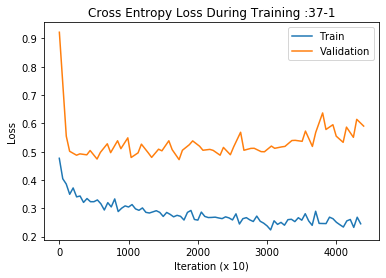

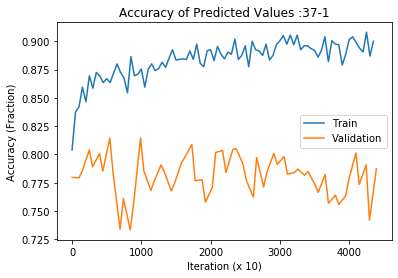

############################ 2 ############################
Number of users = 1119
Total number of data points is:  1935964
Train size =  (1356963, 5)
Validation size =  (579001, 5)


tr_loss:0.828, tr_acc: 0.760, val_loss:0.373, val_acc: 0.857:  33%|███▎      | 45213.333333333336/135540 [06:29<12:57, 116.22it/s]


37
150
convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
convolutions.3.weight : 16x8x3 = 384
convolutions.3.bias : 16
convolutions.6.weight : 32x16x3 = 1536
convolutions.6.bias : 32
linear.0.weight : 3x4672 = 14016
linear.0.bias : 3
Total # of parameters:  16043
16043
40
0.001
30
0.8282329440116882
0.7599999904632568
0.3725695936992672
0.85730994
0.8641608155549554
0.6931928888840918
0.6852772507768037
0.675005838362157
1467
1822
0
1675
20779
0
0
0
0
25743


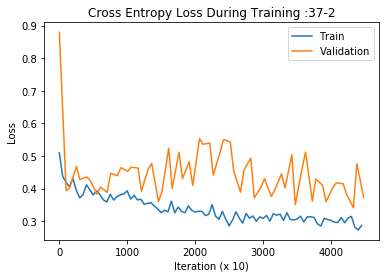

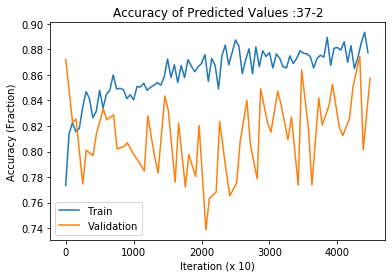

############################ 3 ############################
Number of users = 1119
Total number of data points is:  1935964
Train size =  (1389241, 5)
Validation size =  (546723, 5)


tr_loss:0.307, tr_acc: 0.839, val_loss:0.444, val_acc: 0.818:  33%|███▎      | 46386.66666666667/138960 [06:32<13:03, 118.10it/s]


37
150
convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
convolutions.3.weight : 16x8x3 = 384
convolutions.3.bias : 16
convolutions.6.weight : 32x16x3 = 1536
convolutions.6.bias : 32
linear.0.weight : 3x4672 = 14016
linear.0.bias : 3
Total # of parameters:  16043
16043
40
0.001
30
0.3070812225341797
0.8387096524238586
0.4444083146283729
0.8181644
0.8449580284115368
0.6399944882412676
0.6690796989707434
0.6383841828237276
1199
1488
0
2268
19268
0
0
0
0
24223


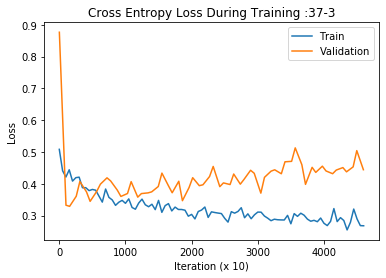

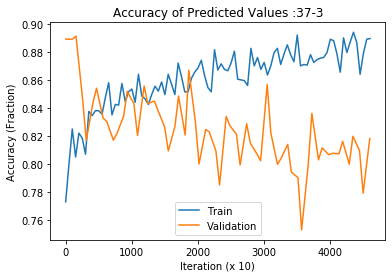

In [ ]:
warnings.filterwarnings('ignore')  # "error", "ignore", "always", "default", "module" or "once"

tops = range(37,38)
# chunk_Length = 100 # valid for Topologies 1-33
# chunk_Length = 50 # valid for Topologies 34-36
# chunk_Length = 150 # valid for Topology 37
iterations = 3
reload_data = 1
for top in tops:
  if top == 37 or top == 44:
    chunk_Length = 150
  elif top == 45 or top == 46:
    chunk_Length = 200
  else:
    chunk_Length = 100

  if top == 40:
    lr = 1e-2
  elif top == 41:
    lr = 1e-4
  else:
    lr = 1e-3

  if top == 42:
    batch_s = 25
  elif top == 43:
    batch_s = 55
  else:
    batch_s = 40 

  for iterate in range(iterations):
  # for iterate in range(6,7): # manually completing last one
    # Code for printing to a file 
    results = open('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/results_WC_combined.txt', 'a')
    # results = open('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/results.txt', 'a') # First round of results
    # results = open('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/results_r2.txt', 'a') # Skip this one
    # results = open('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/results_r3.txt', 'a') # Second round of results
    # results = open('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/results_r4.txt', 'a') # Third round of results
    # results = open('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/rubbish.txt', 'a')
    print("############################",iterate+1,"############################")
    ## Start Here ##
    # batch_s = 40
    # lr = 1e-3 # learning rate of optimizer... could specify a decaying learning rate
    epochs = 30

    # Separate into test and train sections randomly
    # ************ Make sure that all users for all the days have a unique identifier before this point ***********
    if reload_data:
      proportion = 0.7 # percentage of data that will be used during training
      user_list = list(set(data[:,0])) # creating a list of unique segment numbers
      # print(type(user_list))
      num_users = len(user_list) # find number of users
      print('Number of users =',num_users)
      random.shuffle(user_list) # shuffling the user list; this works in-place
      split_index = int(proportion * num_users)
      train_indices = user_list[0:split_index]
      valid_indices = user_list[split_index:]
      rows, cols = data.shape
      print('Total number of data points is: ', rows)
      train_data = np.zeros([1, cols],dtype=float)
      for i in train_indices:
        train_data = np.vstack((train_data , data[np.where(data[:,0] == i)]))
      train_data = np.delete(train_data, 0, 0) # delete initialization row3

      valid_data = np.zeros([1, cols],dtype=float)
      for i in valid_indices:
        valid_data = np.vstack((valid_data , data[np.where(data[:,0] == i)]))
      valid_data = np.delete(valid_data, 0, 0) # delete initialization row

      print('Train size = ',train_data.shape)
      print('Validation size = ',valid_data.shape)

      # pass in and initialize dataset
      train_dataset = AngleDataset(train_data, train_indices,chunk_Length)
      valid_dataset = AngleDataset(valid_data, valid_indices,chunk_Length)
      # train_dataset = StrokeDataset(train_data, train_indices)
      # valid_dataset = StrokeDataset(valid_data, valid_indices)

      train_loader = DataLoader(train_dataset,
                          shuffle = True, # This doesn't randomize the images, it just shuffles them for training purposes
                          batch_size = batch_s, # number of images per batch
                          pin_memory = True) #whatever I write the dateset to, I want it to be the same block of memory every time; Speed improvement thing

      valid_loader = DataLoader(valid_dataset,
                          shuffle = True, # This doesn't randomize the images, it just shuffles them for training purposes
                          batch_size = batch_s, # number of images per batch
                          pin_memory = True) #whatever I write the dateset to, I want it to be the same block of memory every time; Speed improvement thing

    ########################## RUN MODEL #################################
    # Hyperparameters
    beta1 = .9
    beta2 = .99
    batch_size = batch_s # initially defined right after the dataset class
    reload_every = 1000 # was 20

    # Make these global for plotting later
    losses     = []
    losses_v   = []
    accuracy   = []
    accuracy_v = []
    y_hat_collect = []
    save_every = 10

    # def main(train_dataset, train_loader, valid_loader, lr, beta1, beta2, batch_size, epochs, reload_every):
    model = SmallConvNetwork(train_dataset, top)
    model = model.cuda()
    objective = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), betas = (beta1, beta2), lr = lr)

    loop = tqdm(total=len(train_loader) * epochs * iterations, position=0, initial = 100/iterations*iterate)

    for epoch in range(epochs):
      # print('Epoch',epoch)

      if epoch % reload_every == 0 and epoch != 0:
        train_dataset = AngleDataset(train_data, train_indices,chunk_Length)
        valid_dataset = AngleDataset(valid_data, valid_indices,chunk_Length)
        batch_s = batch_size
        train_loader = DataLoader(train_dataset,
                            shuffle = True, # This doesn't randomize the images, it just shuffles them for training purposes
                            batch_size = batch_s, # number of images per batch
                            pin_memory = True) #whatever I write the dateset to, I want it to be the same block of memory every time; Speed improvement thing
        valid_loader = DataLoader(valid_dataset,
                            shuffle = True, # This doesn't randomize the images, it just shuffles them for training purposes
                            batch_size = batch_s, # number of images per batch
                            pin_memory = True) #whatever I write the dateset to, I want it to be the same block of memory every time; Speed improvement thing
        print('Got the new stuff!')

      for batch_num, (x, y_truth) in enumerate(train_loader):
        model.train()
        x, y_truth = x.cuda(async=True), y_truth.cuda(async=True)

        optimizer.zero_grad()

        y_hat = model(x)
        y_hat_class = torch.softmax(y_hat, dim=1).argmax(1).unsqueeze(1)
        loss = objective(y_hat, y_truth.squeeze(1))
        y_hat_collect.append(y_hat_class)
        acc = (y_hat_class == y_truth).float().mean()  

        if batch_num % save_every == 0:
          losses.append(loss.item())
          accuracy.append(acc.item())
          # print(precision_score(y_truth,y_hat_class)
    #       print(torch.softmax(y_hat, 1).argmax(1))
    #       print('\n')
        loss.backward()
        optimizer.step()

        # Validation loop
        if batch_num % 1000 == 0:# and batch_num != 0:
          loss_val, acc_val = getValidationAcc(valid_loader, model.eval(), objective)
          losses_v.append((len(losses),loss_val)) # This keeps the validation loss aligned with the test loss by appending the loss_v vector at the same length as the test loss
          accuracy_v.append((len(accuracy),acc_val))

        # Update progress bar and display loss/accuracy
    #       loop.set_description('loss:{:.4f}, acc: {:.4f}'.format(loss.item(),acc.item()))
        loop.set_description('tr_loss:{:.3f}, tr_acc: {:.3f}, val_loss:{:.3f}, val_acc: {:.3f}'.format(loss.item(),acc.item(),loss_val.item(),acc_val.item()))
        loop.update(1)

    loop.close()

    # Print stuff
    model = model.cpu()
    print(top)
    print(top, file = results)
    print(chunk_Length)
    print(chunk_Length, file = results)

    count_parameters(model)

    print(batch_size)
    print(lr)
    print(epochs)
    print(loss.item())
    print(acc.item())
    print(loss_val)
    print(acc_val)

    print(batch_size, file = results)
    print(lr, file = results)
    print(epochs, file = results)
    print(loss.item(), file = results)
    print(acc.item(), file = results)
    print(loss_val, file = results)
    print(acc_val, file = results)

    quantify_misclassification(model)
    plot_all(losses,accuracy,losses_v,accuracy_v) 
    # main(train_dataset, train_loader, valid_loader, lr, beta1, beta2, batch_size, epochs, reload_every)
    results.close() 

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
results.close() 


In [ ]:

for iterate2 in range(3,4):
  print(iterate2)

3


In [ ]:
# Convert rows of data into rows and columns
x = np.loadtxt('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/results_WC_combined.txt')
save_full = 0;
save_ave = 1;

L = len(x)
y = x.reshape((int(L/24),24),order='C')
if save_full:
  np.savetxt('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/adj_results_3_wc_comb.txt',y,delimiter=',')

# Take average of the 3 runs and save as a single row
if save_ave:
  num_runs = int(np.amax(y[:,0]))-int(np.amin(y[:,0]))+1
  y_ave = np.zeros((num_runs,24))
  for i in range(num_runs):
    y_ave[i,:] = np.mean(y[i*3:i*3+3,:],axis=0)
  np.savetxt('/content/gdrive/My Drive/1 PhD/Africa Water Sensor Study 2018/Africa Water-2018-Shared/Deep Learning Training Results/averages_3rd_wc.txt',y_ave,delimiter=',')

In [ ]:
top = '001'
plot_all(losses,accuracy,losses_v,accuracy_v)

##Explore Params

Layers A-C

convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
convolutions.2.weight : 16x8x3 = 384
convolutions.2.bias : 16
linear.0.weight : 3x1536 = 4608
linear.0.bias : 3
Total # of parameters:  5067


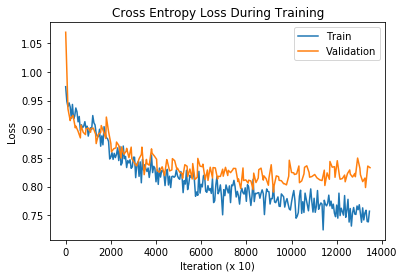

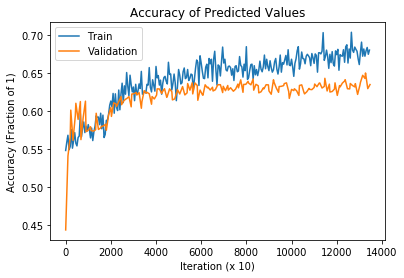

Number of misclassified:  Counter({'Child': 9666, 'Male': 3011, 'Female': 2677})
['Males fraction misclassified = ', 0.5630142109199701]
['Females fraction misclassified = ', 0.1446870608582856]
['Children fraction misclassified = ', 0.5447782223975652]
Total number of each user type:  Counter({'Female': 18502, 'Child': 17743, 'Male': 5348})
['Male fraction = ', 0.12857932825235016] 
 ['Female fraction = ', 0.44483446733825405] 
 ['Child fraction = ', 0.4265862044093958]
Overall percent accuracy: 0.6308513451782751


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# FC = None; 60 Epochs

convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
convolutions.2.weight : 16x8x3 = 384
convolutions.2.bias : 16
linear.0.weight : 3x1536 = 4608
linear.0.bias : 3
Total # of parameters:  5067


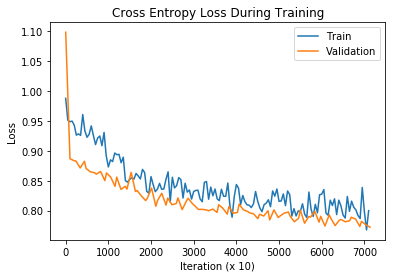

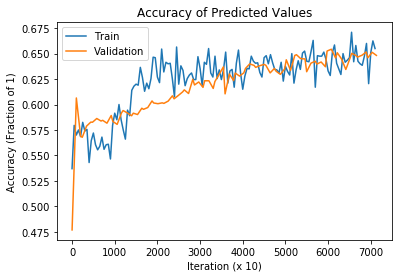

Number of misclassified:  Counter({'Child': 5032, 'Female': 4821, 'Male': 2771})
['Males fraction misclassified = ', 0.6524605603955733]
['Females fraction misclassified = ', 0.27741972609045923]
['Children fraction misclassified = ', 0.3534452482966917]
Total number of each user type:  Counter({'Female': 17378, 'Child': 14237, 'Male': 4247})
['Male fraction = ', 0.11842618928113323] 
 ['Female fraction = ', 0.4845797780380347] 
 ['Child fraction = ', 0.39699403268083205]
Overall percent accuracy: 0.6479839384306508


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# FC = None; 30 Epochs

Layers A-B

convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
linear.1.weight : 3x784 = 2352
linear.1.bias : 3
Total # of parameters:  2411


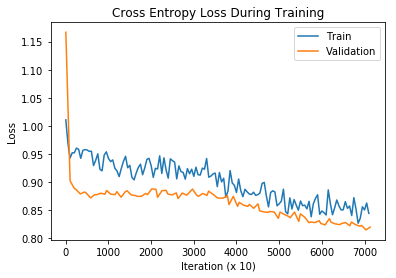

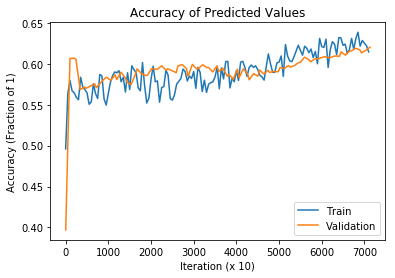

Number of misclassified:  Counter({'Child': 5037, 'Female': 4989, 'Male': 3696})
['Males fraction misclassified = ', 0.8702613609606781]
['Females fraction misclassified = ', 0.2870871216480608]
['Children fraction misclassified = ', 0.35379644588045234]
Total number of each user type:  Counter({'Female': 17378, 'Child': 14237, 'Male': 4247})
['Male fraction = ', 0.11842618928113323] 
 ['Female fraction = ', 0.4845797780380347] 
 ['Child fraction = ', 0.39699403268083205]
Overall percent accuracy: 0.617366571858792


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# FC = None

convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
linear.0.weight : 100x784 = 78400
linear.0.bias : 100
linear.3.weight : 3x100 = 300
linear.3.bias : 3
Total # of parameters:  78859


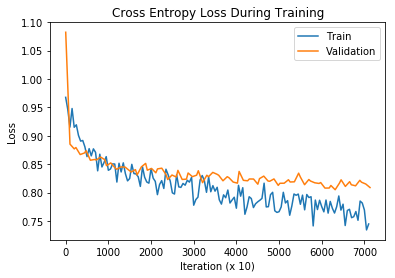

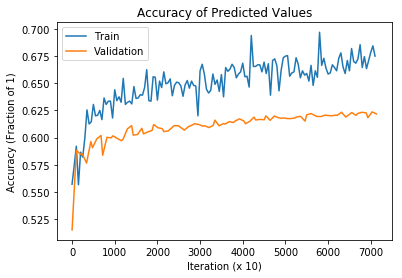

Number of misclassified:  Counter({'Female': 5884, 'Child': 4935, 'Male': 2951})
['Males fraction misclassified = ', 0.6948434188839181]
['Females fraction misclassified = ', 0.33858902060075957]
['Children fraction misclassified = ', 0.34663201517173564]
Total number of each user type:  Counter({'Female': 17378, 'Child': 14237, 'Male': 4247})
['Male fraction = ', 0.11842618928113323] 
 ['Female fraction = ', 0.4845797780380347] 
 ['Child fraction = ', 0.39699403268083205]
Overall percent accuracy: 0.6160281077463611


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# Dropout, FC = 100

convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
linear.0.weight : 100x784 = 78400
linear.0.bias : 100
linear.2.weight : 3x100 = 300
linear.2.bias : 3
Total # of parameters:  78859


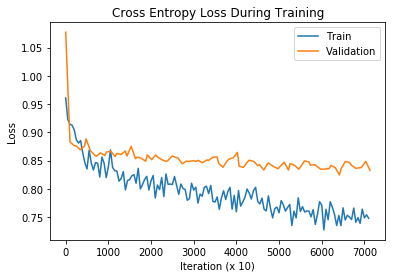

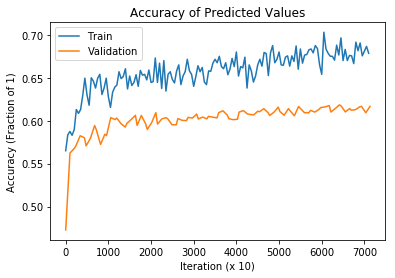

Number of misclassified:  Counter({'Female': 5817, 'Child': 5431, 'Male': 2646})
['Males fraction misclassified = ', 0.6230280197786673]
['Females fraction misclassified = ', 0.3347335711819542]
['Children fraction misclassified = ', 0.3814708154807895]
Total number of each user type:  Counter({'Female': 17378, 'Child': 14237, 'Male': 4247})
['Male fraction = ', 0.11842618928113323] 
 ['Female fraction = ', 0.4845797780380347] 
 ['Child fraction = ', 0.39699403268083205]
Overall percent accuracy: 0.6125704087892476


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# No dropout, FC = 100

###Preliminary Exploration Results

convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
convolutions.2.weight : 16x8x3 = 384
convolutions.2.bias : 16
convolutions.4.weight : 32x16x3 = 1536
convolutions.4.bias : 32
convolutions.7.weight : 64x32x3 = 6144
convolutions.7.bias : 64
convolutions.9.weight : 128x64x3 = 24576
convolutions.9.bias : 128
linear.0.weight : 3x6144 = 18432
linear.0.bias : 3
Total # of parameters:  51371


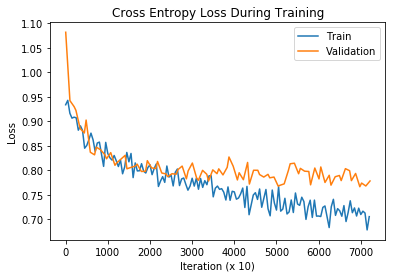

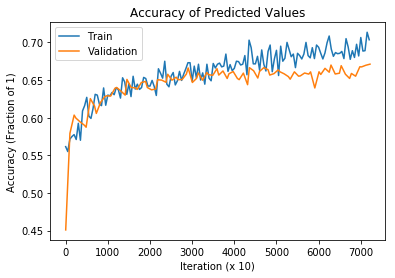

Number of misclassified:  Counter({'Female': 4354, 'Child': 4352, 'Male': 3937})
['Males fraction misclassified = ', 0.5799941072480849]
['Females fraction misclassified = ', 0.2645361200558965]
['Children fraction misclassified = ', 0.3789620341344479]
Total number of each user type:  Counter({'Female': 16459, 'Child': 11484, 'Male': 6788})
['Male fraction = ', 0.19544499150614725] 
 ['Female fraction = ', 0.4738993982321269] 
 ['Child fraction = ', 0.33065561026172585]
Overall percent accuracy: 0.6359736258673807


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)

convolutions.0.weight : 16x2x3 = 96
convolutions.0.bias : 16
convolutions.3.weight : 32x16x3 = 1536
convolutions.3.bias : 32
convolutions.5.weight : 64x32x3 = 6144
convolutions.5.bias : 64
convolutions.8.weight : 128x64x3 = 24576
convolutions.8.bias : 128
convolutions.10.weight : 256x128x3 = 98304
convolutions.10.bias : 256
linear.0.weight : 3x12288 = 36864
linear.0.bias : 3
Total # of parameters:  168019


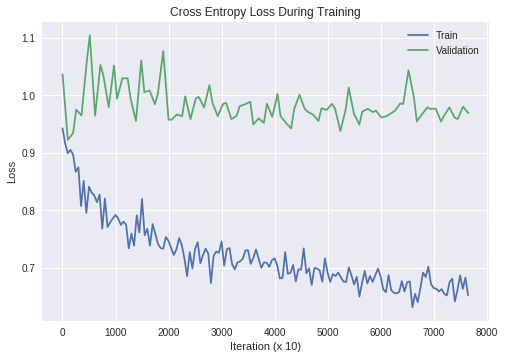

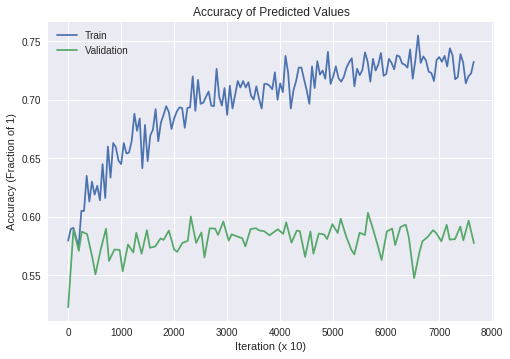

Number of misclassified:  Counter({'Child': 7425, 'Male': 5632, 'Female': 4970})
['Males fraction misclassified = ', 0.752036319935906]
['Females fraction misclassified = ', 0.20970464135021097]
['Children fraction misclassified = ', 0.5251803649738294]
Total number of each user type:  Counter({'Female': 23700, 'Child': 14138, 'Male': 7489})
['Male fraction = ', 0.165221611842831] 
 ['Female fraction = ', 0.5228671652657356] 
 ['Child fraction = ', 0.31191122289143336]
Overall percent accuracy: 0.6022900258124297


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; 30 epochs; non-augmented; starting channels: 16; extra dropout after 1st layer

convolutions.0.weight : 8x2x3 = 48
convolutions.0.bias : 8
convolutions.2.weight : 16x8x3 = 384
convolutions.2.bias : 16
convolutions.4.weight : 32x16x3 = 1536
convolutions.4.bias : 32
convolutions.7.weight : 64x32x3 = 6144
convolutions.7.bias : 64
convolutions.9.weight : 128x64x3 = 24576
convolutions.9.bias : 128
linear.0.weight : 3x6144 = 18432
linear.0.bias : 3
Total # of parameters:  51371


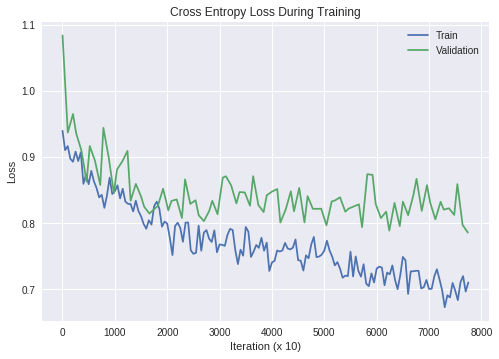

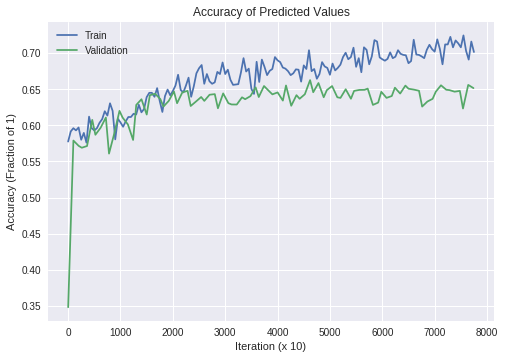

Number of misclassified:  Counter({'Child': 7805, 'Male': 5101, 'Female': 2926})
['Males fraction misclassified = ', 0.5562704471101417]
['Females fraction misclassified = ', 0.1414414849905738]
['Children fraction misclassified = ', 0.5443956197251866]
Total number of each user type:  Counter({'Female': 20687, 'Child': 14337, 'Male': 9170})
['Male fraction = ', 0.20749422998597095] 
 ['Female fraction = ', 0.4680952165452324] 
 ['Child fraction = ', 0.32441055346879666]
Overall percent accuracy: 0.6417613250667511


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; 30 epochs; non-augmented; starting channels: 8

Total # of parameters:  45226


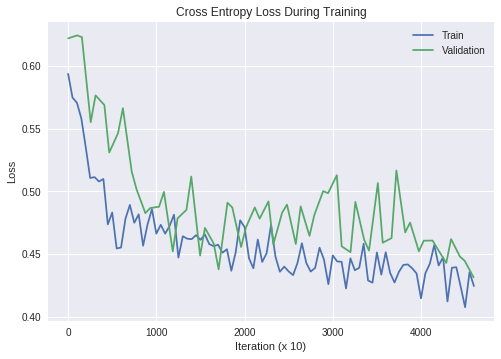

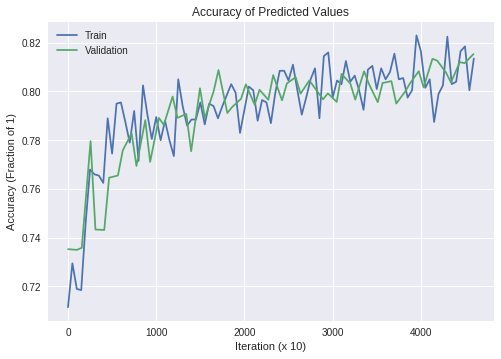

Number of misclassified:  Counter({'Male': 3642, 'Female': 1169})
['Males fraction misclassified = ', 0.5462726863656817]
['Females fraction misclassified = ', 0.06305966123637934]
Total number of each user type:  Counter({'Female': 18538, 'Male': 6667})
['Male fraction = ', 0.26451100972029357] 
 ['Female fraction = ', 0.7354889902797064]
Overall percent accuracy: 0.8091251735766714


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# women v men; 30 epochs; non-augmented

Total # of parameters:  45226


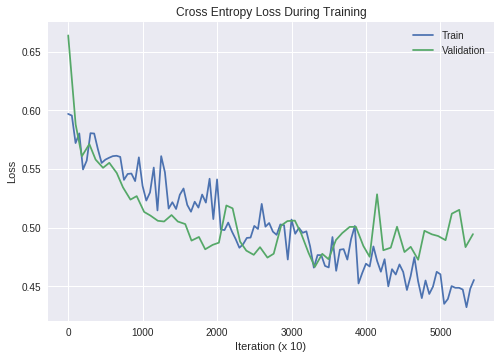

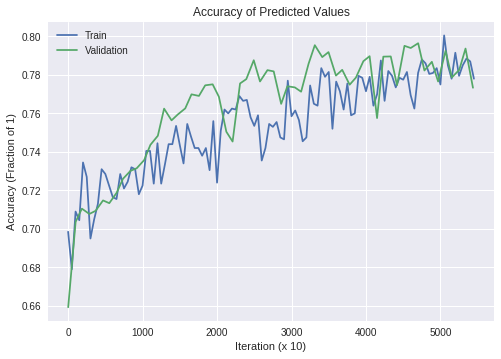

Number of misclassified:  Counter({'Child': 4007, 'Female': 3959})
['Females fraction misclassified = ', 0.17667797215280256]
['Children fraction misclassified = ', 0.34641652978300336]
Total number of each user type:  Counter({'Female': 22408, 'Child': 11567})
['Female fraction = ', 0.6595437821927889] 
 ['Child fraction = ', 0.3404562178072112]
Overall percent accuracy: 0.765533480500368


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# women v children; 30 epochs; non-augmented

Total # of parameters:  45226


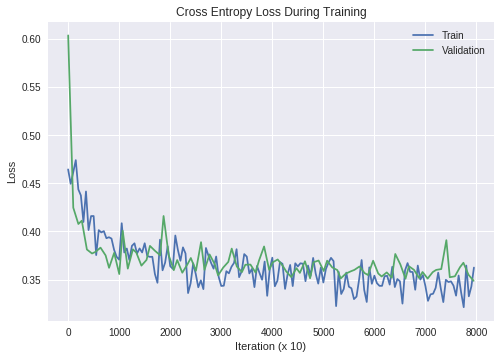

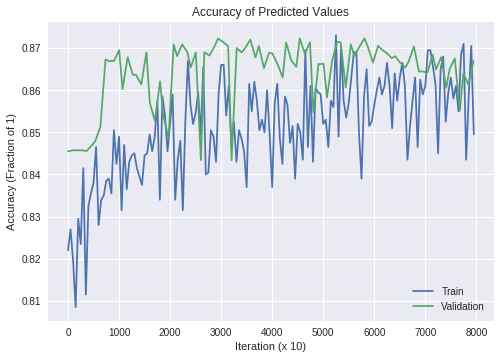

Number of misclassified:  Counter({'Male': 4408, 'Female/Child': 1077})
['Males fraction misclassified = ', 0.6903680501174628]
['Female/Child fraction misclassified = ', 0.030773187039259388]
Total number of each user type:  Counter({'Female/Child': 34998, 'Male': 6385})
['Male fraction = ', 0.15429040910518813] 
 ['Female fraction = ', 0.8457095908948119]
Overall percent accuracy: 0.867457651692724


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# men vs women-children; 30 epochs, non-augmented

Total # of parameters:  51371


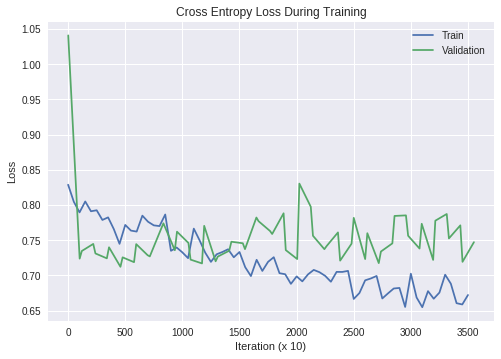

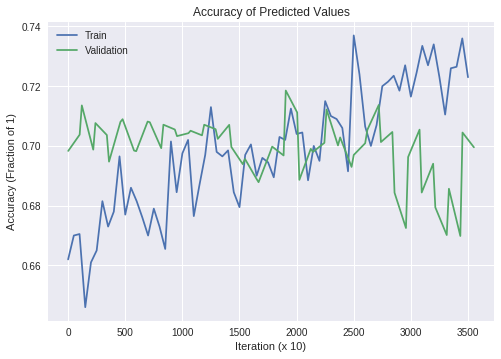

Number of misclassified:  Counter({'Child': 7394, 'Male': 2602, 'Female': 2544})
['Males fraction misclassified = ', 0.4707798082142211]
['Females fraction misclassified = ', 0.08119235311013948]
['Children fraction misclassified = ', 0.7085090072824837]
Total number of each user type:  Counter({'Female': 31333, 'Child': 10436, 'Male': 5527})
['Male fraction = ', 0.11685977672530447] 
 ['Female fraction = ', 0.6624873139377537] 
 ['Child fraction = ', 0.22065290933694182]
Overall percent accuracy: 0.7348612990527741


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunck length 100; non-augmented; 30 epochs; ONLY DAYS 3-4 in Gulu

Total # of parameters:  51371


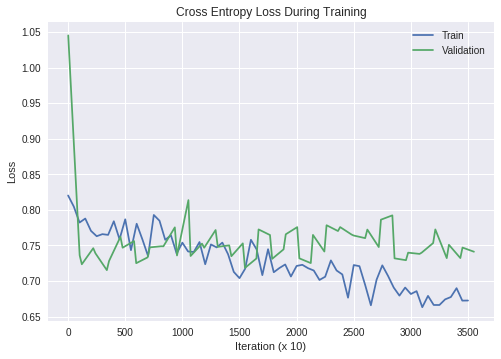

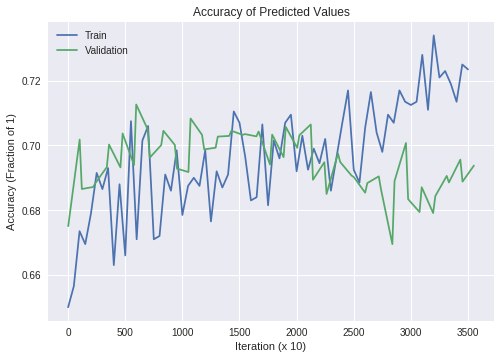

Number of misclassified:  Counter({'Child': 5378, 'Male': 4414, 'Female': 3059})
['Males fraction misclassified = ', 0.798480463096961]
['Females fraction misclassified = ', 0.0976349302607641]
['Children fraction misclassified = ', 0.5150847619959774]
Total number of each user type:  Counter({'Female': 31331, 'Child': 10441, 'Male': 5528})
['Male fraction = ', 0.11687103594080338] 
 ['Female fraction = ', 0.6623890063424948] 
 ['Child fraction = ', 0.2207399577167019]
Overall percent accuracy: 0.7283086680761099


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunck length 100; non-augmented; 30 epochs; ONLY DAYS 3-4 in Gulu

Total # of parameters:  51371


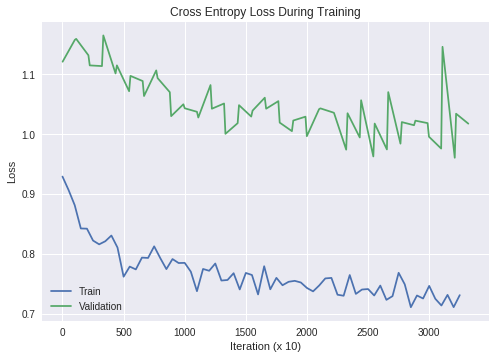

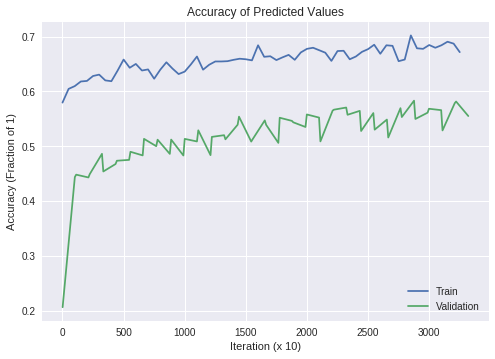

Number of misclassified:  Counter({'Male': 5546, 'Female': 4520, 'Child': 3746})
['Males fraction misclassified = ', 0.4330444288279847]
['Females fraction misclassified = ', 0.4535875564475665]
['Children fraction misclassified = ', 0.17450039595658454]
Total number of each user type:  Counter({'Child': 21467, 'Male': 12807, 'Female': 9965})
['Male fraction = ', 0.28949569384479756] 
 ['Female fraction = ', 0.22525373539184881] 
 ['Child fraction = ', 0.4852505707633536]
Overall percent accuracy: 0.6877867944573792


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunck length 100; non-augmented; 30 epochs; ONLY DAYS 1-2 in Jinja

Total # of parameters:  51371


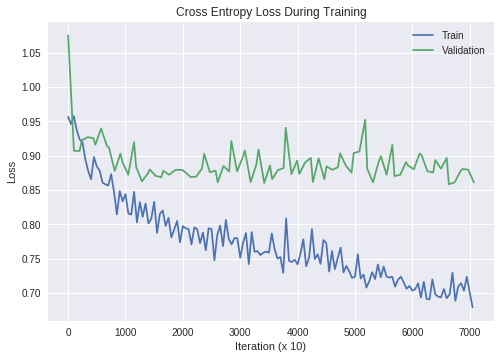

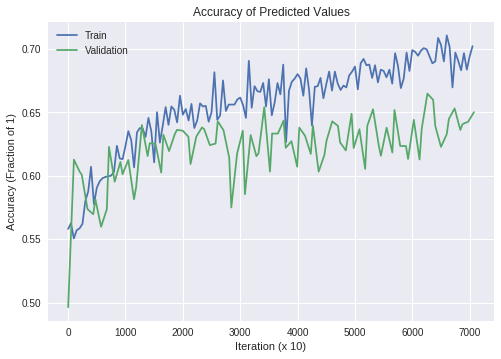

Number of misclassified:  Counter({'Child': 9875, 'Female': 9534, 'Male': 8821})
['Males fraction misclassified = ', 0.47095568606513616]
['Females fraction misclassified = ', 0.21418943206326385]
['Children fraction misclassified = ', 0.3152635443603742]
Total number of each user type:  Counter({'Female': 44512, 'Child': 31323, 'Male': 18730})
['Male fraction = ', 0.19806482313752447] 
 ['Female fraction = ', 0.47070269127055464] 
 ['Child fraction = ', 0.3312324855919209]
Overall percent accuracy: 0.7014751758050018


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunk length 100; non-augmented data; 30 epochs

Total # of parameters:  51371


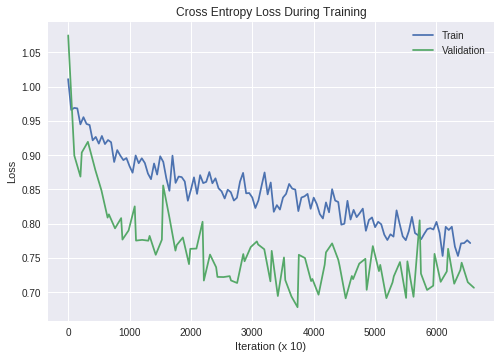

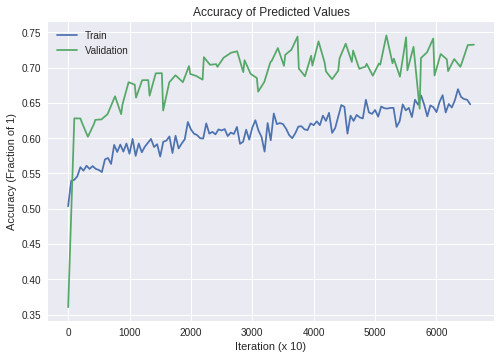

Number of misclassified:  Counter({'Male': 10502, 'Child': 10095, 'Female': 9317})
['Males fraction misclassified = ', 0.6395079771038851]
['Females fraction misclassified = ', 0.24189319001999118]
['Children fraction misclassified = ', 0.30440551216717426]
Total number of each user type:  Counter({'Female': 38517, 'Child': 33163, 'Male': 16422})
['Male fraction = ', 0.18639758461782932] 
 ['Female fraction = ', 0.4371864429865383] 
 ['Child fraction = ', 0.37641597239563235]
Overall percent accuracy: 0.6604617375314976


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunk length 100; non-augmented data; 30 epochs

Total # of parameters:  51371


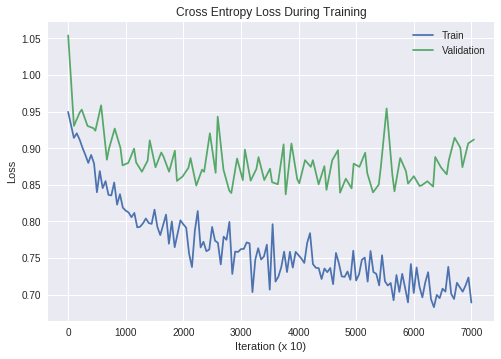

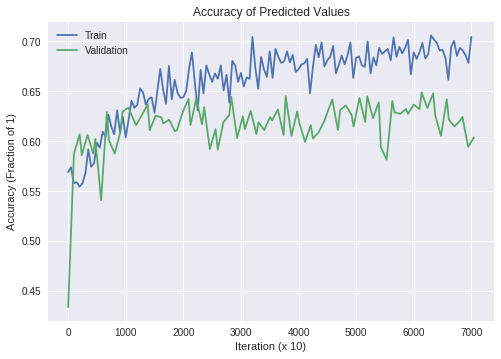

Number of misclassified:  Counter({'Child': 11188, 'Female': 8869, 'Male': 8053})
['Males fraction misclassified = ', 0.44308115543328747]
['Females fraction misclassified = ', 0.18825751947528177]
['Children fraction misclassified = ', 0.38538114429403053]
Total number of each user type:  Counter({'Female': 47111, 'Child': 29031, 'Male': 18175})
['Male fraction = ', 0.19270120975009808] 
 ['Female fraction = ', 0.4994963792317398] 
 ['Child fraction = ', 0.30780241101816214]
Overall percent accuracy: 0.7019625306148414


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunk length 100; non-augmented data; 30 epochs

Total # of parameters:  56363


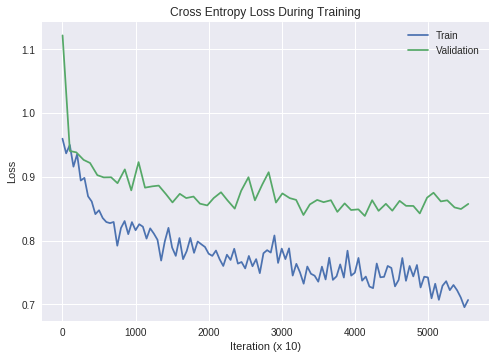

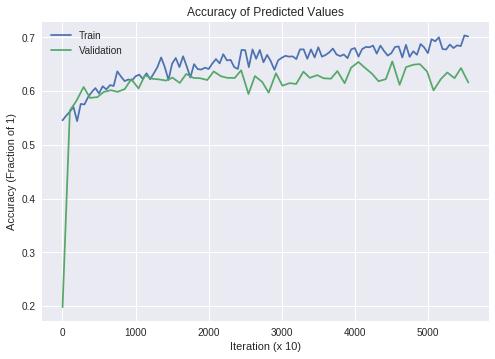

Number of misclassified:  Counter({'Female': 12422, 'Male': 6438, 'Child': 5252})
['Males fraction misclassified = ', 0.4439387670666115]
['Females fraction misclassified = ', 0.3314389391392513]
['Children fraction misclassified = ', 0.22978648932446621]
Total number of each user type:  Counter({'Female': 37479, 'Child': 22856, 'Male': 14502})
['Male fraction = ', 0.1937811510349159] 
 ['Female fraction = ', 0.5008084236407124] 
 ['Child fraction = ', 0.3054104253243716]
Overall percent accuracy: 0.6778064326469527


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunk length 125; non-augmented data; 30 epochs

Total # of parameters:  46763


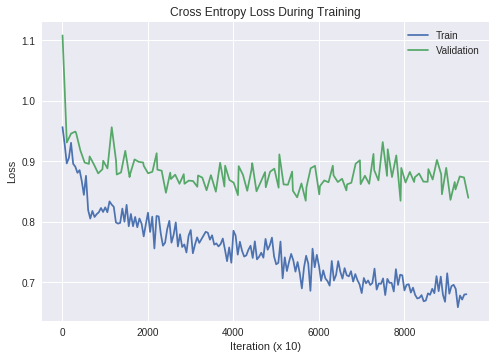

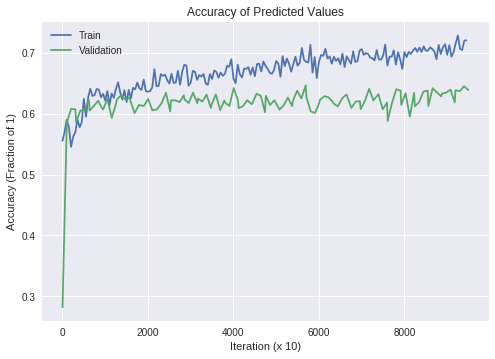

Number of misclassified:  Counter({'Child': 15733, 'Male': 15416, 'Female': 7908})
['Males fraction misclassified = ', 0.6346383434193734]
['Females fraction misclassified = ', 0.1254103430229792]
['Children fraction misclassified = ', 0.39920326812311285]
Total number of each user type:  Counter({'Female': 63057, 'Child': 39411, 'Male': 24291})
['Male fraction = ', 0.19163136345348258] 
 ['Female fraction = ', 0.49745580195489075] 
 ['Child fraction = ', 0.3109128345916266]
Overall percent accuracy: 0.6918798665183536


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunk length 75; non-augmented data; 30 epochs

Total # of parameters:  41771


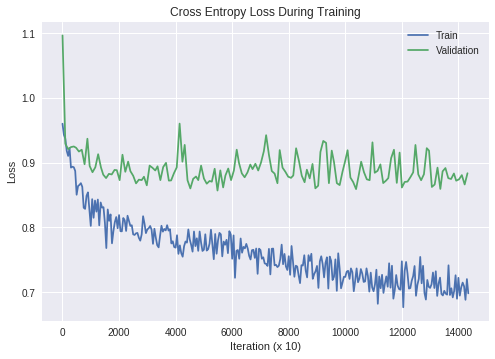

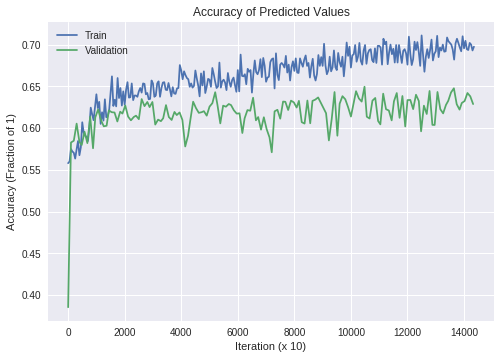

Number of misclassified:  Counter({'Child': 23280, 'Female': 22425, 'Male': 13281})
['Males fraction misclassified = ', 0.36257166257166257]
['Females fraction misclassified = ', 0.23588378844616484]
['Children fraction misclassified = ', 0.38801293376445883]
Total number of each user type:  Counter({'Female': 95068, 'Child': 59998, 'Male': 36630})
['Male fraction = ', 0.1910837993489692] 
 ['Female fraction = ', 0.49593105750772054] 
 ['Child fraction = ', 0.3129851431433102]
Overall percent accuracy: 0.6922940489107754


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunk length 50; non-augmented data; 30 epochs

Total # of parameters:  51371


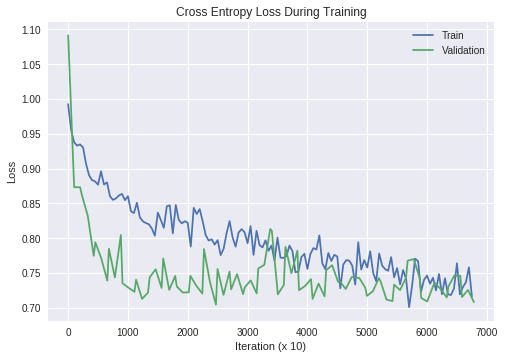

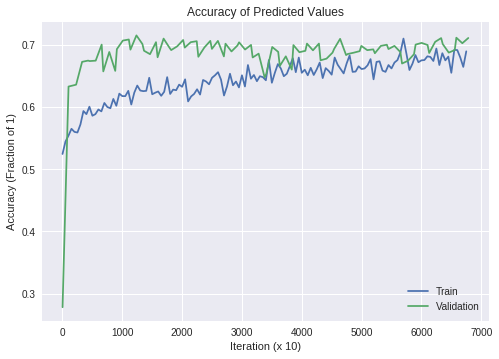

Number of misclassified:  Counter({'Child': 11295, 'Male': 10464, 'Female': 7277})
['Males fraction misclassified = ', 0.5807848143420103]
['Females fraction misclassified = ', 0.18398098753571157]
['Children fraction misclassified = ', 0.34092967099305765]
Total number of each user type:  Counter({'Female': 39553, 'Child': 33130, 'Male': 18017})
['Male fraction = ', 0.1986438809261301] 
 ['Female fraction = ', 0.43608599779492835] 
 ['Child fraction = ', 0.36527012127894154]
Overall percent accuracy: 0.6798676957001102


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M, W, C; chunk length 100; non-augmented data; 30 epochs

Total # of parameters:  51371


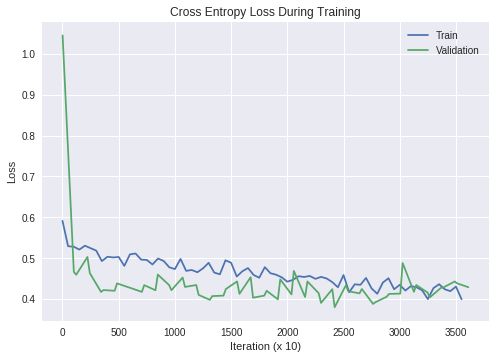

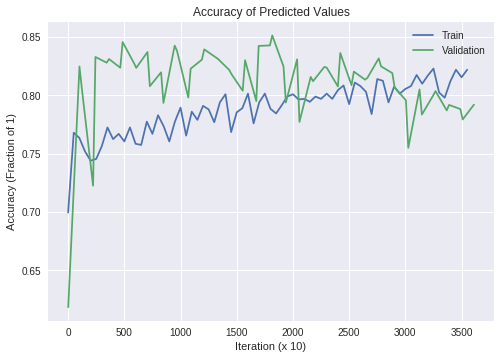

Number of misclassified:  Counter({'Child': 4728, 'Male': 3934})
['Males fraction misclassified = ', 0.24366676989780117]
['Children fraction misclassified = ', 0.1481806500141035]
Total number of each user type:  Counter({'Child': 31907, 'Male': 16145})
['Male fraction = ', 0.3359901773079164] 
 ['Child fraction = ', 0.6640098226920835]
Overall percent accuracy: 0.819736951635728


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M/C only; chunk length 100

Total # of parameters:  60971


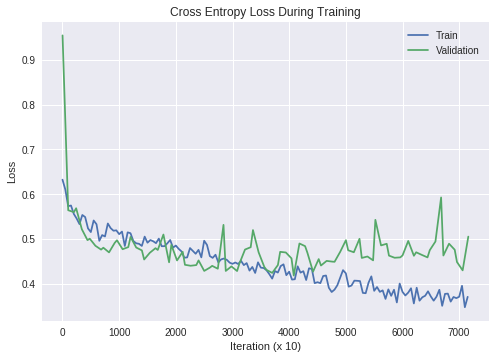

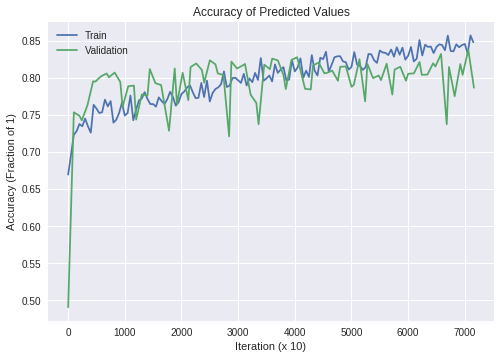

Number of misclassified:  Counter({'Male': 7355, 'Child': 6359})
['Males fraction misclassified = ', 0.15012961564368965]
['Children fraction misclassified = ', 0.13636851021852417]
Total number of each user type:  Counter({'Male': 48991, 'Child': 46631})
['Male fraction = ', 0.5123402564263454] 
 ['Child fraction = ', 0.4876597435736546]
Overall percent accuracy: 0.8565811214992366


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M/C only

Total # of parameters:  60971


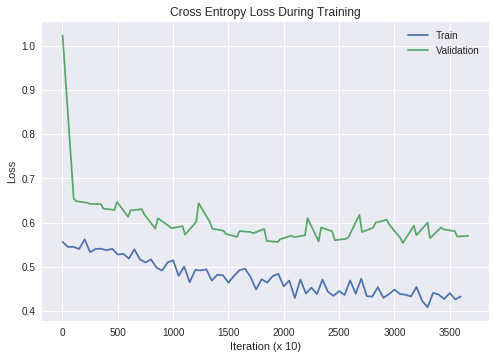

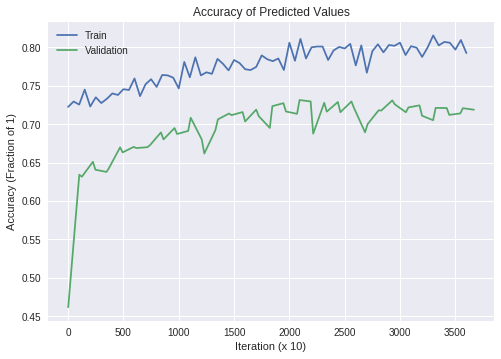

Number of misclassified:  Counter({'Child': 6891, 'Female': 2676})
['Females fraction misclassified = ', 0.09218050292800552]
['Children fraction misclassified = ', 0.3424609879733625]
Total number of each user type:  Counter({'Female': 29030, 'Child': 20122})
['Female fraction = ', 0.5906168619791666] 
 ['Child fraction = ', 0.4093831380208333]
Overall percent accuracy: 0.80535888671875


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# F/C only

Total # of parameters:  60971


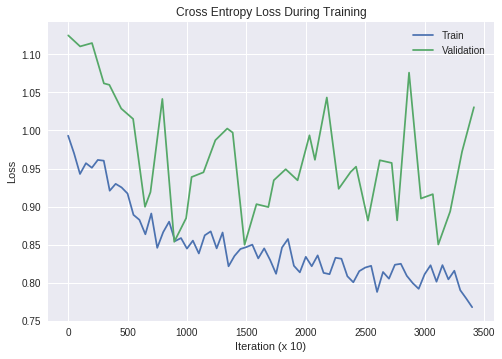

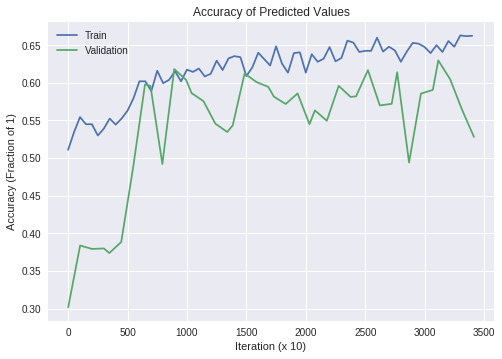

Number of misclassified:  Counter({'Male': 24619, 'Child': 16442, 'Female': 7603})
['Males fraction misclassified = ', 0.7787126364067689]
['Females fraction misclassified = ', 0.12061170423719403]
['Children fraction misclassified = ', 0.3779943905466918]
Total number of each user type:  Counter({'Female': 63037, 'Child': 43498, 'Male': 31615})
['Male fraction = ', 0.22884545783568586] 
 ['Female fraction = ', 0.45629388346000727] 
 ['Child fraction = ', 0.3148606587043069]
Overall percent accuracy: 0.6477452044878755


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#10 Same as earlier (#4) but changed Augment parameter (not Male, but the total Augment parameter) from 0.01 to 0.1

Total # of parameters:  60971


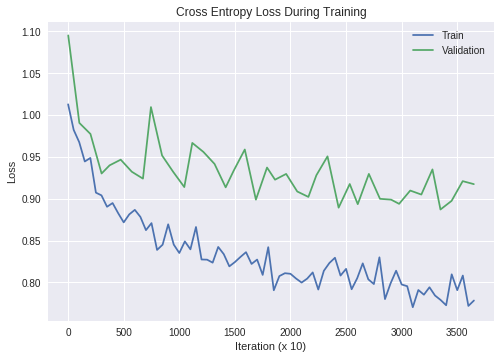

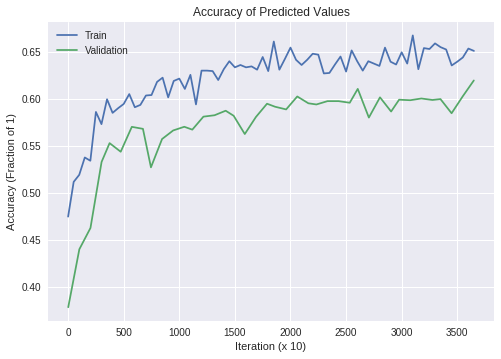

Number of misclassified:  Counter({'Female': 22388, 'Child': 18700, 'Male': 11280})
['Males fraction misclassified = ', 0.25131449959896623]
['Females fraction misclassified = ', 0.3671608501705589]
['Children fraction misclassified = ', 0.43736551595097767]
Total number of each user type:  Counter({'Female': 60976, 'Male': 44884, 'Child': 42756})
['Male fraction = ', 0.3020132421811918] 
 ['Female fraction = ', 0.4102922969263067] 
 ['Child fraction = ', 0.2876944608925015]
Overall percent accuracy: 0.647628788286591


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#10 Same as earlier (#4) but changed Augment parameter (not Male, but the total Augment parameter) from 0.01 to 0.02

Total # of parameters:  60971


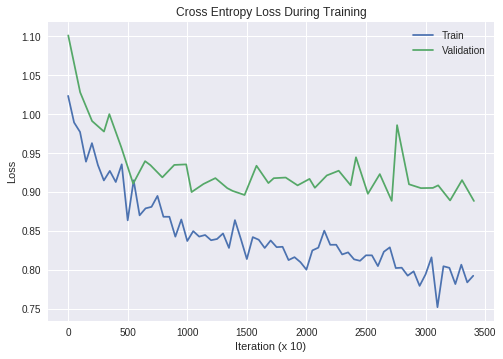

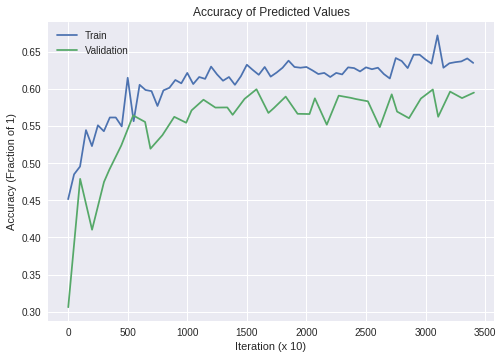

Number of misclassified:  Counter({'Female': 23649, 'Male': 14035, 'Child': 10981})
['Males fraction misclassified = ', 0.3440203936563963]
['Females fraction misclassified = ', 0.43985046311795556]
['Children fraction misclassified = ', 0.25331610879143696]
Total number of each user type:  Counter({'Female': 53766, 'Child': 43349, 'Male': 40797})
['Male fraction = ', 0.29581907303207844] 
 ['Female fraction = ', 0.3898573003074424] 
 ['Child fraction = ', 0.31432362666047914]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#10 Same as earlier (#4)

Total # of parameters:  60971


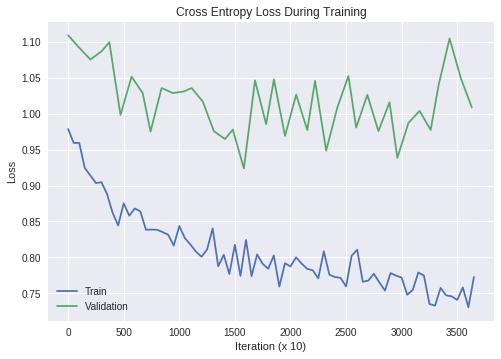

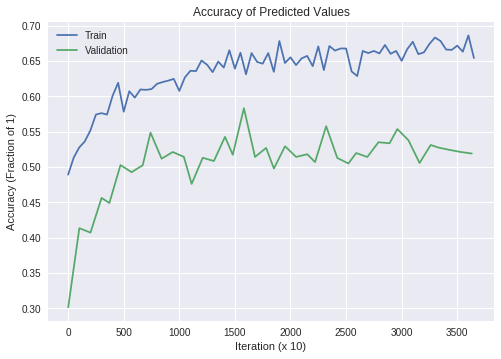

Number of misclassified:  Counter({'Male': 18725, 'Child': 16520, 'Female': 12589})
['Males fraction misclassified = ', 0.4633868692617981]
['Females fraction misclassified = ', 0.19134836071803135]
['Children fraction misclassified = ', 0.39622958290360494]
Total number of each user type:  Counter({'Female': 65791, 'Child': 41693, 'Male': 40409})
['Male fraction = ', 0.2732313226454261] 
 ['Female fraction = ', 0.4448554022164673] 
 ['Child fraction = ', 0.2819132751381066]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#10 Same as earlier (#4) but changed Augment parameter (not Male, but the total Augment parameter) from 0.01 to 0.0001

Total # of parameters:  554411


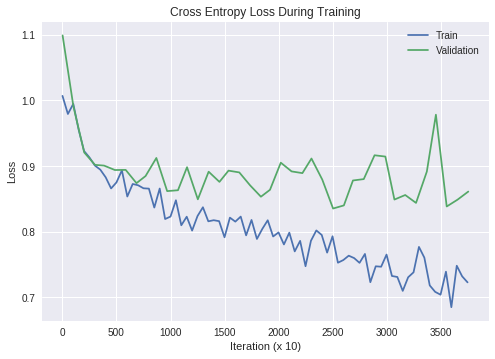

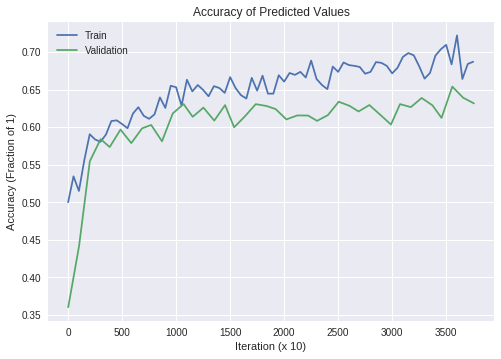

Number of misclassified:  Counter({'Female': 20645, 'Child': 14943, 'Male': 10716})
['Males fraction misclassified = ', 0.27695647679106794]
['Females fraction misclassified = ', 0.28404947647941003]
['Children fraction misclassified = ', 0.3550671260544137]
Total number of each user type:  Counter({'Female': 72681, 'Child': 42085, 'Male': 38692})
['Male fraction = ', 0.2521341344211446] 
 ['Female fraction = ', 0.47362144691055535] 
 ['Child fraction = ', 0.2742444186683001]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#9 added 2 extra conv layers w/extra dropout

Total # of parameters:  554411


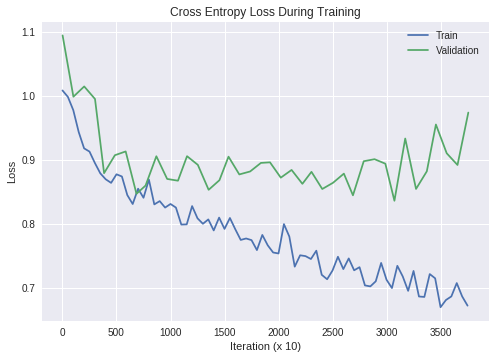

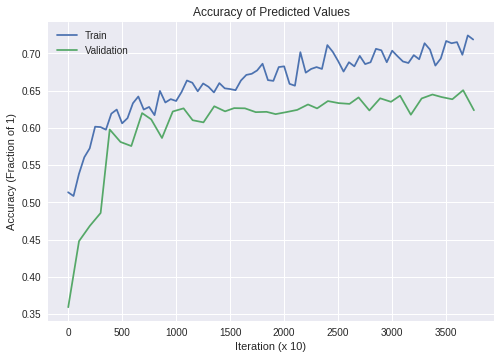

Number of misclassified:  Counter({'Male': 17720, 'Child': 14755, 'Female': 11480})
['Males fraction misclassified = ', 0.4579758089527551]
['Females fraction misclassified = ', 0.15795049600308195]
['Children fraction misclassified = ', 0.3505999762385648]
Total number of each user type:  Counter({'Female': 72681, 'Child': 42085, 'Male': 38692})
['Male fraction = ', 0.2521341344211446] 
 ['Female fraction = ', 0.47362144691055535] 
 ['Child fraction = ', 0.2742444186683001]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#8 added 2 extra conv layers

Total # of parameters:  500339


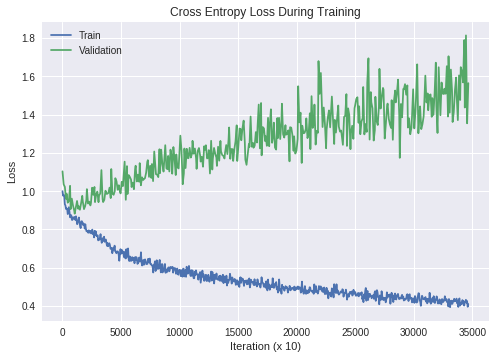

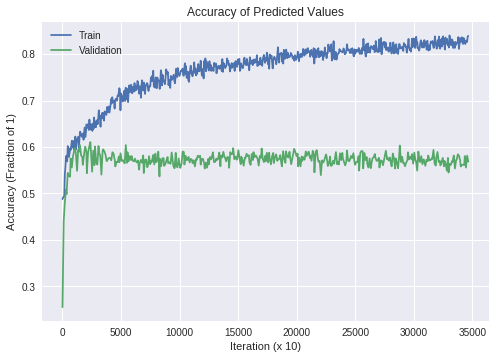

Number of misclassified:  Counter({'Female': 11474, 'Child': 8461, 'Male': 3858})
['Males fraction misclassified = ', 0.10081793712598322]
['Females fraction misclassified = ', 0.19911842287935583]
['Children fraction misclassified = ', 0.1982241589354325]
Total number of each user type:  Counter({'Female': 57624, 'Child': 42684, 'Male': 38267})
['Male fraction = ', 0.2761464910698178] 
 ['Female fraction = ', 0.41583258163449394] 
 ['Child fraction = ', 0.30802092729568825]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#7 With bad removed; Used SELU, added FC to be size in to 50 to 3 with dropout between 50 and 3, 100 epochs

Total # of parameters:  60971


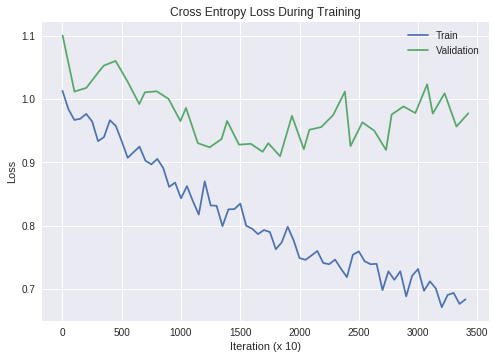

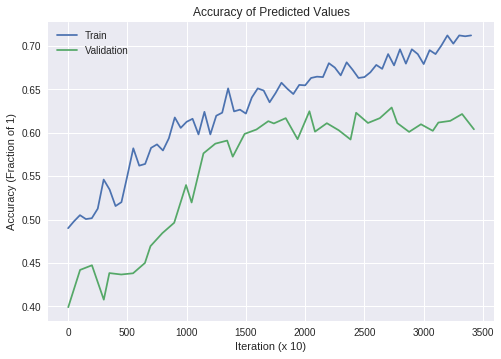

Number of misclassified:  Counter({'Child': 13834, 'Female': 13574, 'Male': 12704})
['Males fraction misclassified = ', 0.3319831708783025]
['Females fraction misclassified = ', 0.23556157156740248]
['Children fraction misclassified = ', 0.3241027082747634]
Total number of each user type:  Counter({'Female': 57624, 'Child': 42684, 'Male': 38267})
['Male fraction = ', 0.2761464910698178] 
 ['Female fraction = ', 0.41583258163449394] 
 ['Child fraction = ', 0.30802092729568825]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#6 With bad users removed; Got rid of random dropout layer in FC layer; Used leaky RELU instead of RELU as act function

Total # of parameters:  60971


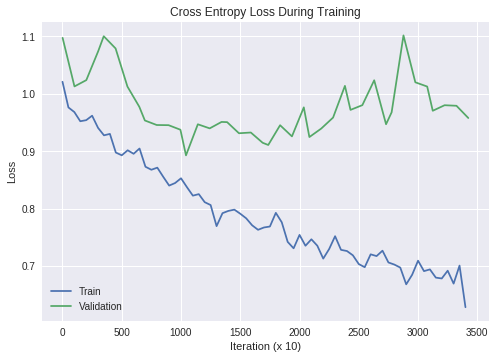

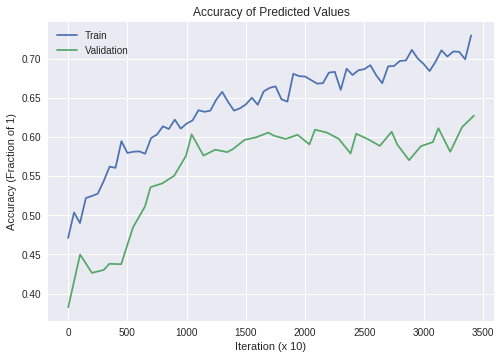

Number of misclassified:  Counter({'Child': 14968, 'Male': 12160, 'Female': 12040})
['Males fraction misclassified = ', 0.31776726683565476]
['Females fraction misclassified = ', 0.20894071914480078]
['Children fraction misclassified = ', 0.3506700402961297]
Total number of each user type:  Counter({'Female': 57624, 'Child': 42684, 'Male': 38267})
['Male fraction = ', 0.2761464910698178] 
 ['Female fraction = ', 0.41583258163449394] 
 ['Child fraction = ', 0.30802092729568825]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#5: With bad users removed; Got rid of random dropout layer in FC layer; Used RELU instead of SELU as act function

Total # of parameters:  60971


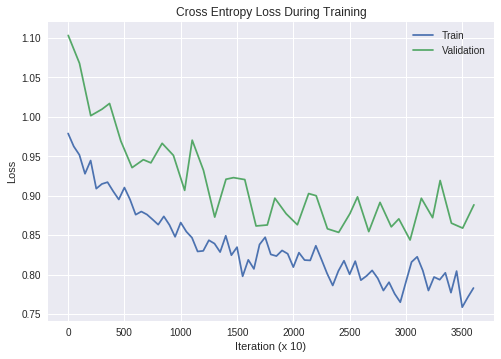

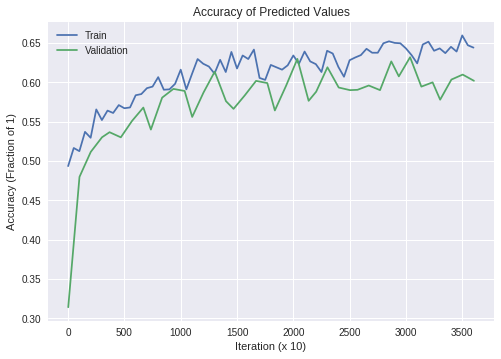

Number of misclassified:  Counter({'Male': 20112, 'Female': 15237, 'Child': 14723})
['Males fraction misclassified = ', 0.43542834874104225]
['Females fraction misclassified = ', 0.26579098853943167]
['Children fraction misclassified = ', 0.34179918746372606]
Total number of each user type:  Counter({'Female': 57327, 'Male': 46189, 'Child': 43075})
['Male fraction = ', 0.31508755653484866] 
 ['Female fraction = ', 0.3910676644541616] 
 ['Child fraction = ', 0.29384477901098977]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#4: With bad users removed but got rid of random Dropout layer in FC layer (SELU act. func.)

Total # of parameters:  60971


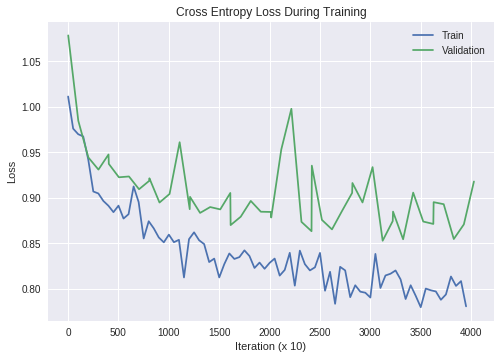

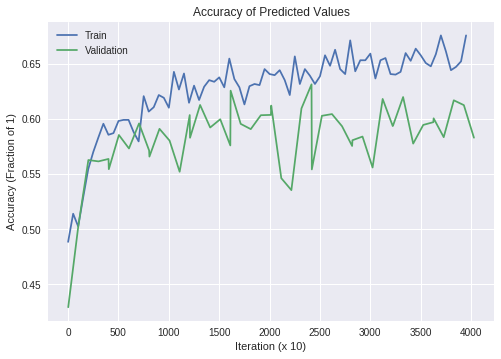

Number of misclassified:  Counter({'Child': 25377, 'Male': 18627, 'Female': 12071})
['Males fraction misclassified = ', 0.3818338355574688]
['Females fraction misclassified = ', 0.17154591706221756]
['Children fraction misclassified = ', 0.6051508286634076]
Total number of each user type:  Counter({'Female': 70366, 'Male': 48783, 'Child': 41935})
['Male fraction = ', 0.3028419954806188] 
 ['Female fraction = ', 0.43682799036527525] 
 ['Child fraction = ', 0.26033001415410595]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
#3: Without bad users removed but got rid of random Dropout layer in FC layer

Total # of parameters:  60971


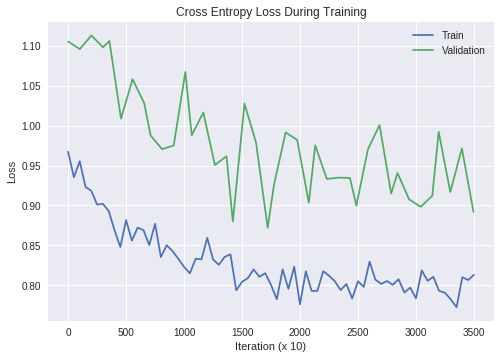

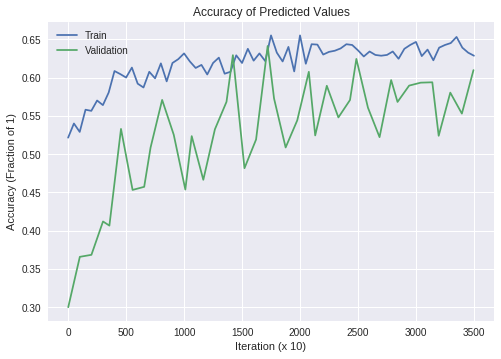

Number of misclassified:  Counter({'Female': 23574, 'Male': 18308, 'Child': 9786})
['Males fraction misclassified = ', 0.4874983357741978]
['Females fraction misclassified = ', 0.3871444524732313]
['Children fraction misclassified = ', 0.22498620562810373]
Total number of each user type:  Counter({'Female': 60892, 'Child': 43496, 'Male': 37555})
['Male fraction = ', 0.264578034844973] 
 ['Female fraction = ', 0.42898910125895606] 
 ['Child fraction = ', 0.30643286389607094]


In [ ]:
#2: With bad users removed

Total # of parameters:  60971


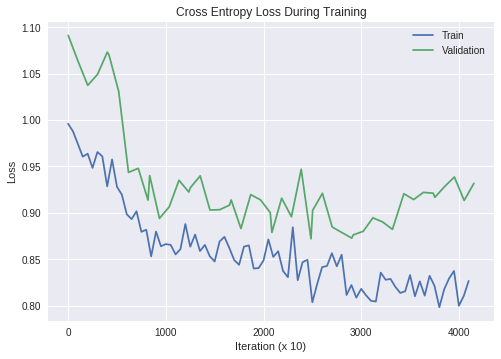

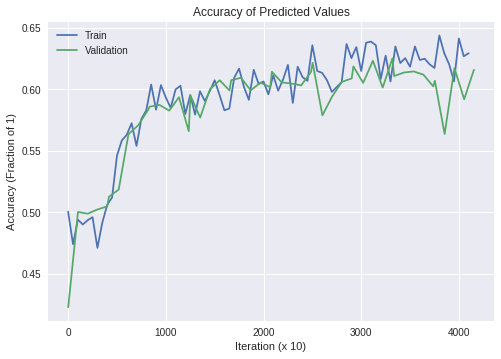

Number of misclassified:  Counter({'Female': 23612, 'Male': 21080, 'Child': 16807})
['Males fraction misclassified = ', 0.43847241867043846]
['Females fraction misclassified = ', 0.32408246177495953]
['Children fraction misclassified = ', 0.36771977420907537]
Total number of each user type:  Counter({'Female': 72858, 'Male': 48076, 'Child': 45706})
['Male fraction = ', 0.2885021603456553] 
 ['Female fraction = ', 0.43721795487277965] 
 ['Child fraction = ', 0.27427988478156506]


In [ ]:
#1: Without bad users removed

#Currently Unneeded Stuff

## Check to see if all new user numbers are ascending


In [ ]:
raw_data_clean = pd.concat([raw_data1[raw_data1.iloc[:,10] != 0], raw_data2[raw_data2.iloc[:,10] != 0],
                            raw_data3[raw_data3.iloc[:,10] != 0], raw_data4[raw_data4.iloc[:,10] != 0]])
raw_data_clean = raw_data_clean.values # convert to numpy

for i in range(raw_data_clean.shape[0]):
  if i != 0 and raw_data_clean[i,10] < raw_data_clean[i-1,10]:
    print(i)
    break
  else:
#     print(i)
    continue

## Augment Functions (Not needed right now)

In [ ]:
## Use this function if you want to double the sample size with samples with added noise
def AugmentData(data):
  random_num = np.random.normal(0, 0.01, size=data.shape[0]) # create a normal distribution of random numbers (mostly within 0.04 of zero) 
  more_data = data
  more_data[:,2] = more_data[:,2] + random_num # add those random numbers to each angle point of the men's data
  augmented_data = np.concatenate((data, more_data)) # return a data array with double the amount of men's data, which is slightly adjusted 
  
  return augmented_data

## Use this function if you want to double the MALE sample size with samples with added noise
def AugmentMaleData(data):
  indices = np.where(data[:,4]==1) # find the indices where the men are (returns a tuple where the [0] dimension is what we want)
  random_num = np.random.normal(0, 0.01, size=indices[0].shape[0]) # create a normal distribution of random numbers (mostly within 0.04 of zero) 
  more_data = data[indices[0],:]
  more_data[:,2] = more_data[:,2] + random_num # add those random numbers to each angle point of the men's data
  augmented_data = np.concatenate((data, more_data)) # return a data array with double the amount of men's data, which is slightly adjusted 
  
  return augmented_data

##Stroke Data

In [ ]:
# uncomment if we only want to use Day 1's data
# raw_data2 = raw_data1[raw_data1.iloc[:,10] != 0] # get rid of segments labeled as 0 (bad data)
# raw_data2 = raw_data2.values # convert to numpy

raw_data_clean = pd.concat([raw_data1[raw_data1.iloc[:,10] != 0], raw_data2[raw_data2.iloc[:,10] != 0],
                            raw_data3[raw_data3.iloc[:,10] != 0], raw_data4[raw_data4.iloc[:,10] != 0]])
# raw_data_clean = raw_data1[raw_data1.iloc[:,10] != 0]
raw_data_clean = raw_data_clean.values # convert to numpy
m , n = raw_data_clean.shape # get only needed columns
data = np.zeros((m,5),dtype=float)
data[:,0] = raw_data_clean[:,10] # New User Number
data[:,1] = raw_data_clean[:,0]/1000  # Time in seconds
data[:,2] = raw_data_clean[:,3]  # Angle (for angle model)/Half Stoke Amplitude (for stroke model)
data[:,3] = raw_data_clean[:,1]  # dt (because sampling isn't a consistent 25 Hz)/ Half Stroke Period
data[:,4] = raw_data_clean[:,11] # Type  

delta = [] # represents the difference in angle between time steps
garbage = [] # represents the data points where no pumping is happening

## use to remove any non-pumping data
for i in range(len(data)-1): 
  delta.append(data[i,2]-data[i+1,2])
  if abs(delta[i]) < 0.01:  # 0.01 was chosen by looking at deltas and finding that some were as low as 0.05, but most were around 1
    garbage.append(i)
print("Number of pumping segments:",len(data)-len(garbage))
print("Number of non-pumping segments: ",len(garbage))

# print(data.shape)
data = np.delete(data, garbage, 0) # this removes all the rows corresponding to those recorded in "garbage"
print("Reduced data length: ",data.shape)

to_augment = False
if to_augment:
  data = AugmentData(data)
  print("Before augmenting: ", data.shape)
  data = AugmentMaleData(data)
  print("After augmenting: ", data.shape)

# remove users of a specific type
# type_to_remove = 1 # 1=M, 2=W, 3=C
# data = data[np.logical_not(data[:,4] == type_to_remove)]

# print(type(data[0,1]))
# print(data[0:10,1])

# print(data.shape)

# plot_data = True
# if plot_data:
#   plt.plot(data[:,1],data[:,3])
#   plt.show()

# Separate into test and train sections randomly
# ************ Make sure that all users for all the days have a unique identifier before this point ***********

proportion = 0.7 # percentage of data that will be used during training
user_list = list(set(data[:,0])) # creating a list of unique segment numbers
# print(type(user_list))

num_users = len(user_list) # find number of users
print('Number of users =',num_users)

random.shuffle(user_list) # shuffling the user list; this works in-place

split_index = int(proportion * num_users)
# print(split_index)

train_indices = user_list[0:split_index]
valid_indices = user_list[split_index:]

# print(train_indices[0])

rows, cols = data.shape
print('Total number of data points is: ', rows)

# print('The time is %10.3f.' % data[5003,1])

train_data = np.zeros([1, cols],dtype=float)
for i in train_indices:
  train_data = np.vstack((train_data , data[np.where(data[:,0] == i)]))
train_data = np.delete(train_data, 0, 0) # delete initialization row3

valid_data = np.zeros([1, cols],dtype=float)
for i in valid_indices:
  valid_data = np.vstack((valid_data , data[np.where(data[:,0] == i)]))
valid_data = np.delete(valid_data, 0, 0) # delete initialization row

print('Train size = ',train_data.shape)
print('Validation size = ',valid_data.shape)


Number of pumping segments: 2176748
Number of non-pumping segments:  264954
Reduced data length:  (2176748, 5)
Number of users = 1181
Total number of data points is:  2176748
Train size =  (1508996, 5)
Validation size =  (667752, 5)


### Stroke Dataset

In [ ]:
class StrokeDataset(Dataset):
  def __init__(self, data_in, indices):
    super(StrokeDataset, self).__init__()
    
    self.data_out, self.label_out = self.process_data(data_in, indices)
    
  def __getitem__(self,i):
    x = self.data_out[i]
    y = self.label_out[i]
#     return x, y.float() # Use for MSELoss
    return x, y
    
  def __len__(self):
    return len(self.label_out)
  
  def process_data(self, data, index):
    chunk_length = 12 # number of half strokes
    big_jump = []
    

    data_out_m = np.zeros((1,chunk_length,3),dtype=float) # Initialize master data out (x)
    labels_m = np.zeros((1,1),dtype=int)# Initialize labels out (y)

    # Create a for loop that gets the data for one user then does all the magic for it:
    for i in index:
      #   print('User:',i)
      single_user = data[np.where(data[:,0] == i)] # get the data for one user

      len_user, cc = single_user.shape
      #   print(len_user)
      if len_user <= chunk_length: # skip users whose total lengths are less than the chunk length
        continue # go to the next iteration


      # Calculate total pump time of user for use later as second channel
      duration_seconds = single_user[-1,1] - single_user[0,1]
      duration_ind, skip = single_user.shape
      #   print(duration)
      #   print(duration_ind)

      num_chunks = int(duration_ind/chunk_length) # Starting from beginning of array, get chunks of size chunk_length
      #   print(num_chunks)

      # Create and combine chunks
      new_chunks = np.zeros([1, chunk_length, 2],dtype=float) # initialize array for concatenation in the loop
      for j in range(num_chunks):
        new_chunk = single_user[np.newaxis,0+j*chunk_length:chunk_length+j*chunk_length, 2:4]
        new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0
        new_chunks = np.vstack((new_chunks, new_chunk))
      #     print(new_chunk.shape)
      new_chunks = np.delete(new_chunks, 0, 0) # delete initialization row
      #   print('new',new_chunk.shape)

      # Also augment by getting random chunks
      random_sets = 6 # changed from 3 to 10 for only Day 1 data; improved acc from 50% to 100%
      for j in range(random_sets * num_chunks):
        start_ind = np.random.randint(0,duration_ind - chunk_length)
        new_chunk = single_user[np.newaxis, start_ind:start_ind + chunk_length, 2:4]
#         new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0 # Take this out for the Stroke Dataset
        
        # this loop removes any chunks with large (>65) jumps 
        for k in range(new_chunk.shape[0]):
#           counter_chunks += 1
#           if max(new_chunk[k, :, 0]) - min(new_chunk[k, :, 0]) < 65:
#             counter_recorded += 1
#             big_jump.append(new_chunk[k, :, 0]) # each chunk, all the angle data
            new_chunks = np.vstack((new_chunks, new_chunk))
        
#       for i in range(min(len(big_jump), 10)):
#         plt.plot(big_jump[i])
#         plt.show()
      
      # Augment by...

      # Combine data
      current_num_chunks, a, b = new_chunks.shape
      dur_array = np.full((current_num_chunks, chunk_length, 1), duration_seconds) # creating channel for the duration
      new_chunks = np.concatenate((new_chunks,dur_array), axis = 2) # Concatenate on the duration channel
      data_out_m = np.vstack((data_out_m, new_chunks )) # concatenate on all chunks from that user
    #   print(data_out_m.shape)

      # create labels
      labels_m = np.vstack((labels_m, np.full((current_num_chunks, 1), single_user[0,4])))
#     pdb.set_trace()
    data_out_m = np.delete(data_out_m, 0, 0) # delete initialization row
    labels_out_m = np.delete(labels_m,0,0) # delete initialization row
    labels_out_m = labels_out_m - 1 # reassign M/W/C to [0, 1, 2] so I can use cross entropy loss

    # Normalize data for better gradients
    # Normalizing params: We want to choose these such that after dividing the original values by this, we get a value between -1 and 1 or 0 and 1 (on the 1 scale)
    amp_norm = 55 # 25 was chosen because we want the max value of this to be approx. 1 and the max amplitude is 50 degrees and half of that is 25;
    per_norm = 1 # The max dt is about 80 ms
    dur_norm = 600 # the max duration is about 600 seconds

    data_out_m[:,:,0] = data_out_m[:,:,0]/amp_norm
    data_out_m[:,:,1] = data_out_m[:,:,1]/per_norm
    data_out_m[:,:,2] = data_out_m[:,:,2]/dur_norm
#     print('Data size = ',data_out_m.shape)
#     print('Classification size = ',labels_out_m.shape)
#     print('Mean of all amplitudes (should be ~0 if normalization worked) = ', np.mean(data_out_m[:,:,0]))
    
    # convert final data from numpy arrays to tensors
    data_out_m = torch.Tensor(data_out_m)
    labels_out_m = torch.Tensor(labels_out_m).long()
#     print("data type = ", data_out_m.type())
#     print("label type = ", labels_out_m.type())
    data_out_m = data_out_m.permute(0, 2, 1)
#     print("permuted = ", data_out_m[:,0:2,:].size())


# Output: x, y tuple; x = Data arrays of chunks (i.e. 600 users *~10 chunks/user) x 100(chunk len)x3 (angle, dt, duration) arrays; y = labels = Separate array/list of 600 (users) x 1 (User Type)   
    return data_out_m[:,0:2,:], labels_out_m # x, y ; x = 5000 x 100 x 3 ; y = 5000 x 1

In [ ]:
# train_dataset = AngleDataset(train_data, train_indices)

In [ ]:
print(len(big_jump))
train_dataset.data_out.size()

In [ ]:
train_dataset.data_out.size()

##Augmented Data, Stroke Dataset

Total # of parameters:  34091


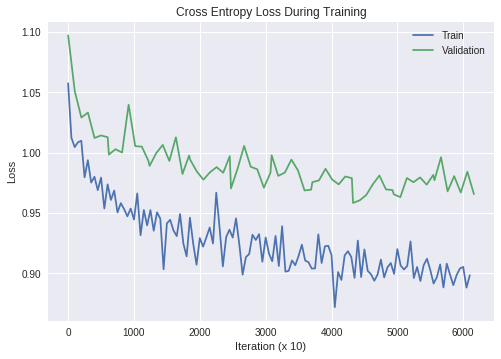

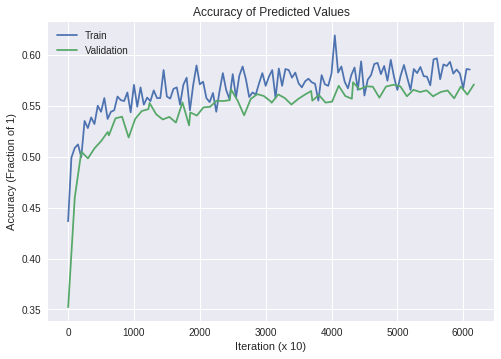

Number of misclassified:  Counter({'Child': 44062, 'Male': 31909, 'Female': 26045})
['Males fraction misclassified = ', 0.48514565468588455]
['Females fraction misclassified = ', 0.24622554997778345]
['Children fraction misclassified = ', 0.584074550298917]
Total number of each user type:  Counter({'Female': 105777, 'Child': 75439, 'Male': 65772})
['Male fraction = ', 0.2662963382836413] 
 ['Female fraction = ', 0.4282677700940936] 
 ['Child fraction = ', 0.30543589162226503]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; Using positive and negative strokes; 10 epochs; chunk size=10

Total # of parameters:  34091


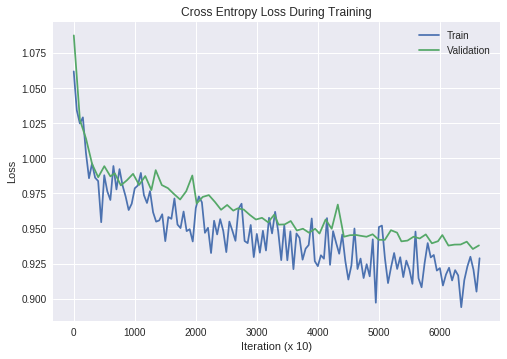

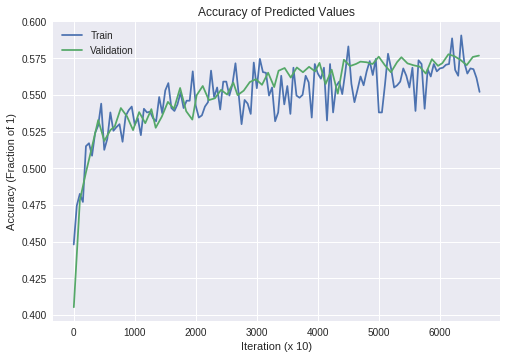

Number of misclassified:  Counter({'Child': 40648, 'Male': 39546, 'Female': 36255})
['Males fraction misclassified = ', 0.48634887839433294]
['Females fraction misclassified = ', 0.33893630745930986]
['Children fraction misclassified = ', 0.5073706546838919]
Total number of each user type:  Counter({'Female': 106967, 'Male': 81312, 'Child': 80115})
['Male fraction = ', 0.3029575921965469] 
 ['Female fraction = ', 0.3985446768556674] 
 ['Child fraction = ', 0.2984977309477857]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; Using positive (absolute value) strokes; 10 epochs; chunk size=10

Total # of parameters:  34475


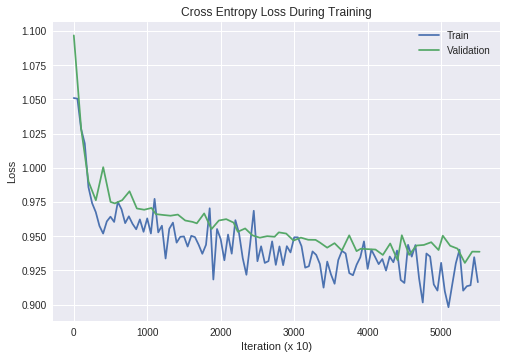

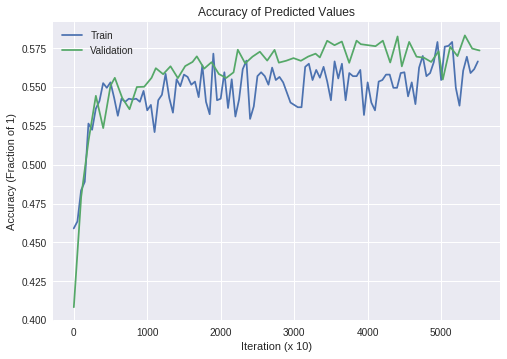

Number of misclassified:  Counter({'Child': 40176, 'Female': 28951, 'Male': 28381})
['Males fraction misclassified = ', 0.4188892004782076]
['Females fraction misclassified = ', 0.32529944493134677]
['Children fraction misclassified = ', 0.6049782409010827]
Total number of each user type:  Counter({'Female': 88998, 'Male': 67753, 'Child': 66409})
['Male fraction = ', 0.3036072772898369] 
 ['Female fraction = ', 0.3988080301129235] 
 ['Child fraction = ', 0.29758469259723963]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; Using positive (absolute value) strokes; 10 epochs; chunk size=12

Total # of parameters:  48419


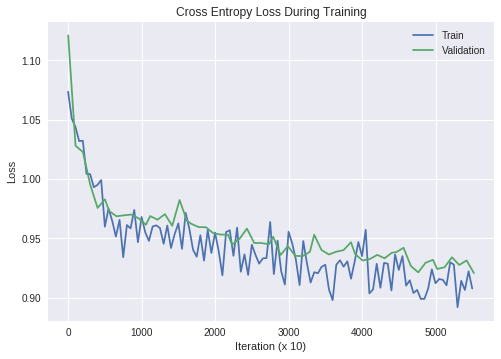

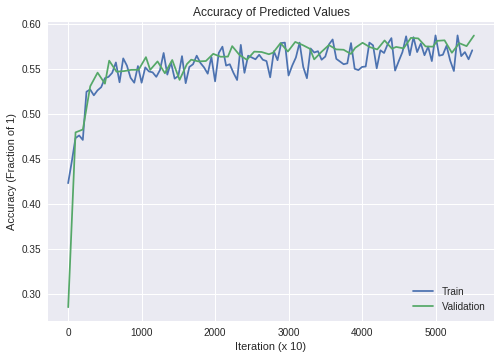

Number of misclassified:  Counter({'Child': 33416, 'Female': 32069, 'Male': 30658})
['Males fraction misclassified = ', 0.45249656841763464]
['Females fraction misclassified = ', 0.3603339400885413]
['Children fraction misclassified = ', 0.5031848092878978]
Total number of each user type:  Counter({'Female': 88998, 'Male': 67753, 'Child': 66409})
['Male fraction = ', 0.3036072772898369] 
 ['Female fraction = ', 0.3988080301129235] 
 ['Child fraction = ', 0.29758469259723963]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; Using positive (absolute value) strokes; 10 epochs; chunk size=12; Added a second fully connected layer and dropout

Total # of parameters:  48419


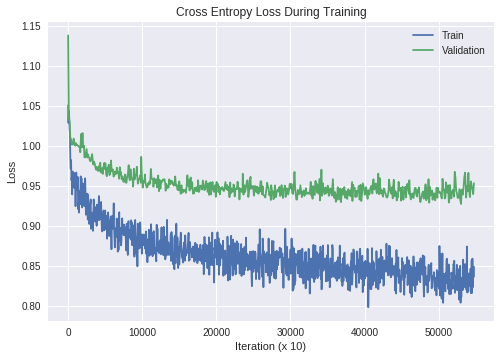

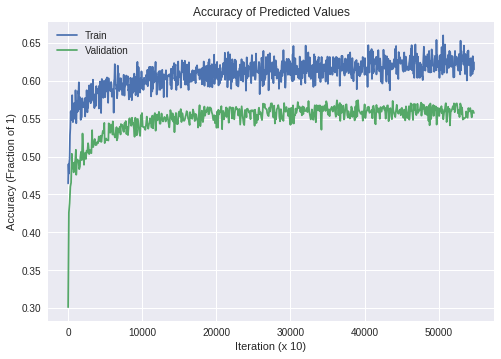

Number of misclassified:  Counter({'Child': 30017, 'Male': 29977, 'Female': 21950})
['Males fraction misclassified = ', 0.4603276976704903]
['Females fraction misclassified = ', 0.24482466315695547]
['Children fraction misclassified = ', 0.4660011798677306]
Total number of each user type:  Counter({'Female': 89656, 'Male': 65121, 'Child': 64414})
['Male fraction = ', 0.2970970523424776] 
 ['Female fraction = ', 0.409031392712292] 
 ['Child fraction = ', 0.29387155494523043]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; Using positive (absolute value) strokes; 100 epochs; chunk size=12; Added a second fully connected layer and dropout

In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# MWC; Using positive (absolute value) strokes; 10 epochs; chunk size=12; Added a second fully connected layer and dropout

##Augmented Data, Angle Dataset

Total # of parameters:  60971


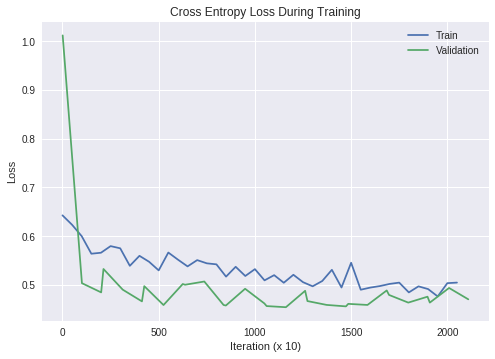

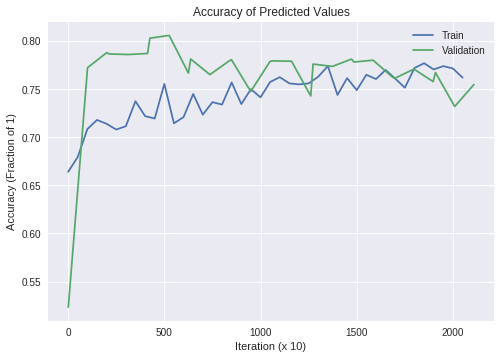

Number of misclassified:  Counter({'Child': 10271, 'Male': 8017})
['Males fraction misclassified = ', 0.18369497972183396]
['Children fraction misclassified = ', 0.24961722604321093]
Total number of each user type:  Counter({'Male': 43643, 'Child': 41147})
['Male fraction = ', 0.5147187168298148] 
 ['Child fraction = ', 0.48528128317018515]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M/C only; 10 epochs; simple net

Total # of parameters:  60971


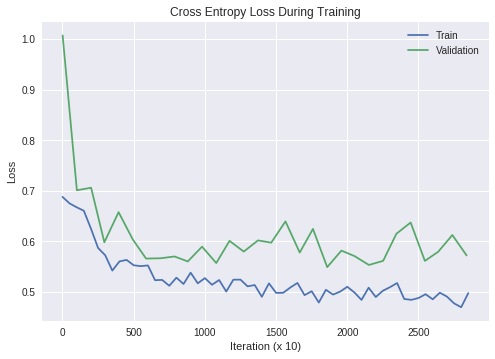

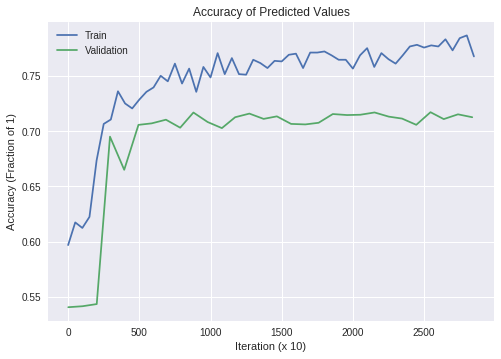

Number of misclassified:  Counter({'Male': 14951, 'Female': 11630})
['Males fraction misclassified = ', 0.33924033399891085]
['Females fraction misclassified = ', 0.15963433716748565]
Total number of each user type:  Counter({'Female': 72854, 'Male': 44072})
['Male fraction = ', 0.3769221558934711] 
 ['Female fraction = ', 0.6230778441065289]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# M/W only; 10 epochs; simple net

Total # of parameters:  60971


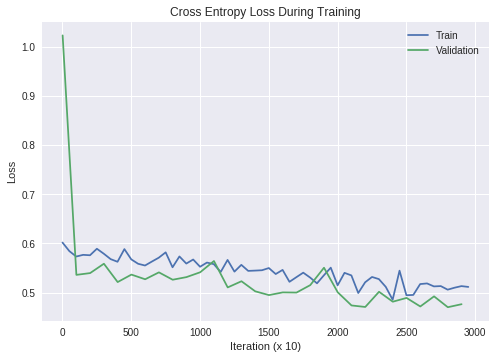

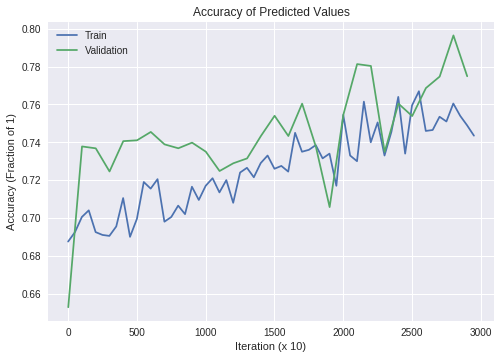

Number of misclassified:  Counter({'Child': 18762, 'Female': 11092})
['Females fraction misclassified = ', 0.15434280466423622]
['Children fraction misclassified = ', 0.3916256157635468]
Total number of each user type:  Counter({'Female': 71866, 'Child': 47908})
['Female fraction = ', 0.6000133584918262] 
 ['Child fraction = ', 0.3999866415081737]


In [ ]:
model = model.cpu()
count_parameters(model)
plot_all(losses,accuracy,losses_v,accuracy_v) 
quantify_misclassification(model)
# W/C only; 10 epochs; simple net

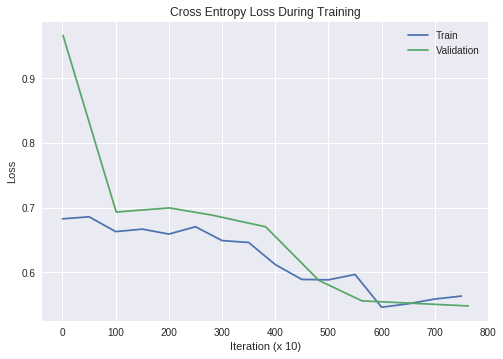

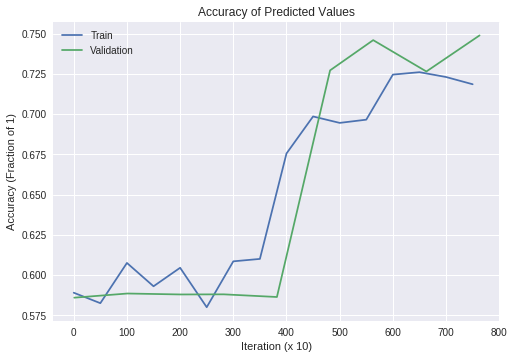

Total # of parameters:  60971
Number of misclassified:  Counter({'Female': 50191, 'Male': 21525})
['Males fraction misclassified = ', 0.4841648297269333]
['Females fraction misclassified = ', 0.7425473051943249]
Total number of each user type:  Counter({'Female': 67593, 'Male': 44458})
['Male fraction = ', 0.3967657584492776] 
 ['Female fraction = ', 0.6032342415507225]


In [ ]:
plot_all(losses,accuracy,losses_v,accuracy_v) # M/W only; 3 epochs; simple net
quantify_misclassification()
# Don't pay attention to the misclassification info

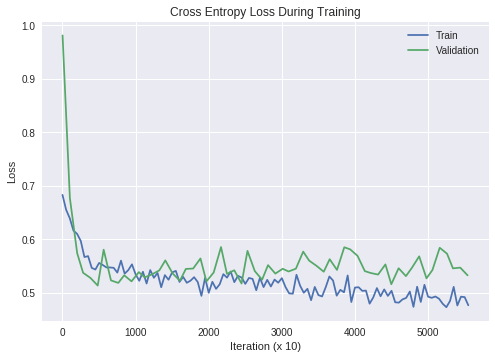

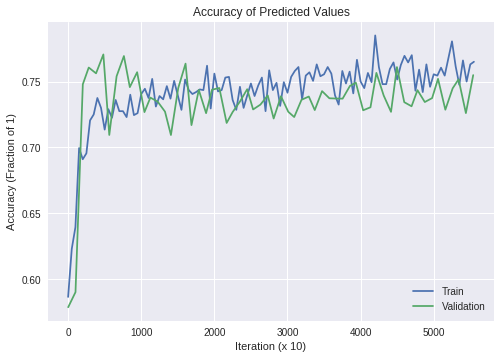

Total # of parameters:  60971
Number of misclassified:  Counter({'Female': 27060, 'Male': 26878})
['Males fraction misclassified = ', 0.6045706059651806]
['Females fraction misclassified = ', 0.4003373130353735]
Total number of each user type:  Counter({'Female': 67593, 'Male': 44458})
['Male fraction = ', 0.3967657584492776] 
 ['Female fraction = ', 0.6032342415507225]


In [ ]:
plot_all(losses,accuracy,losses_v,accuracy_v) # M/W only; 20 epochs; simple net
quantify_misclassification()
# Don't pay attention to the misclassification info

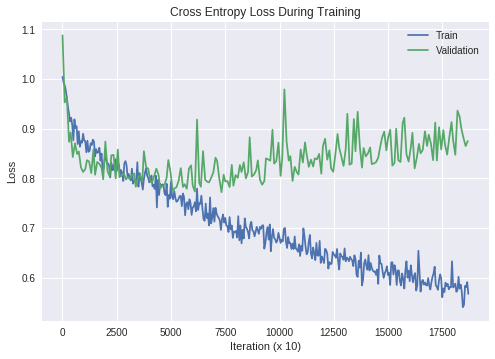

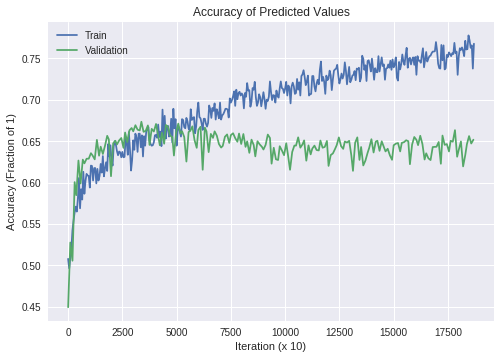

In [ ]:
plot_all(losses,accuracy,losses_v,accuracy_v)

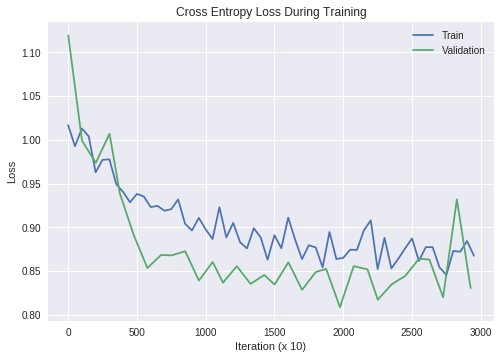

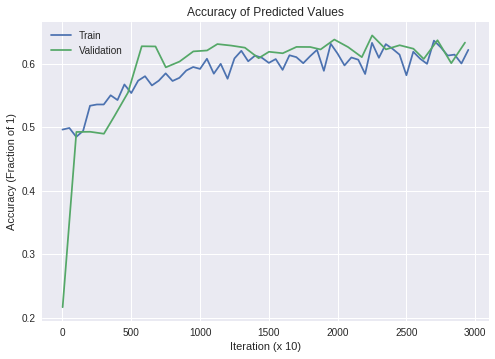

In [ ]:
# Augmented data
plot_all(losses,accuracy,losses_v,accuracy_v)

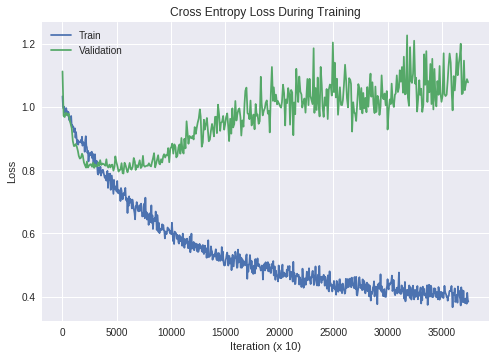

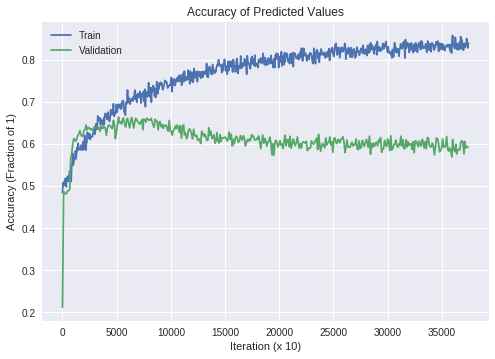

In [ ]:
# A-E layers, dropout of 0.4 in between FC layers

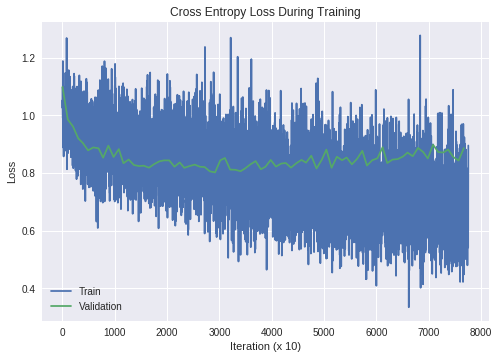

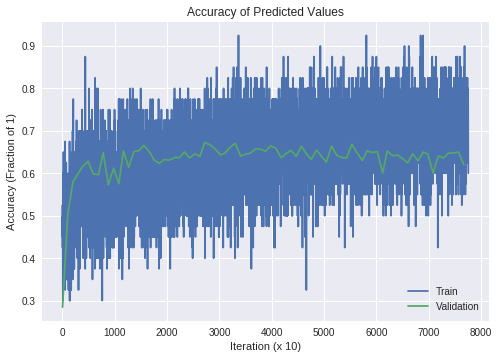

In [ ]:
# SELU, 50 FC layer

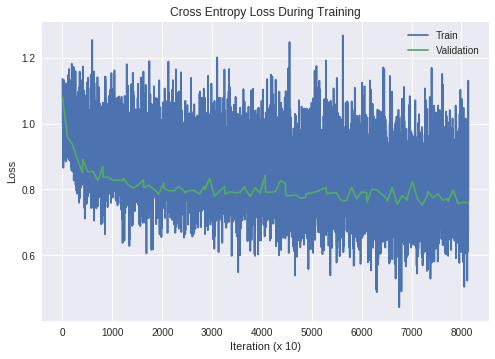

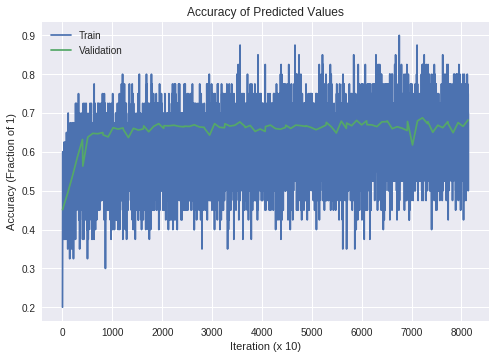

In [ ]:
# SELU, with another Fully connected Linear Layer, with dropout in Linear Layer

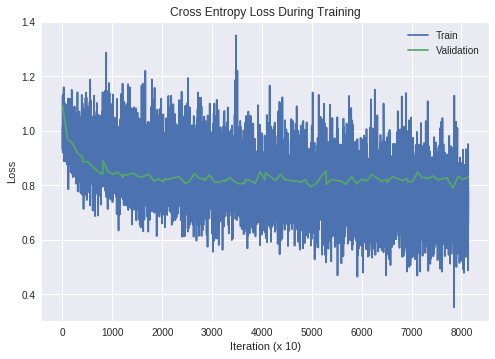

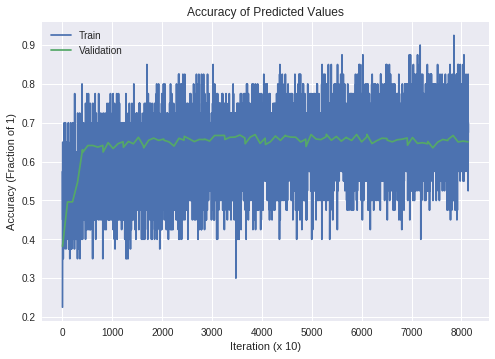

In [ ]:
# SELU, with another Fully connected Linear Layer, no dropout in Linear Layer

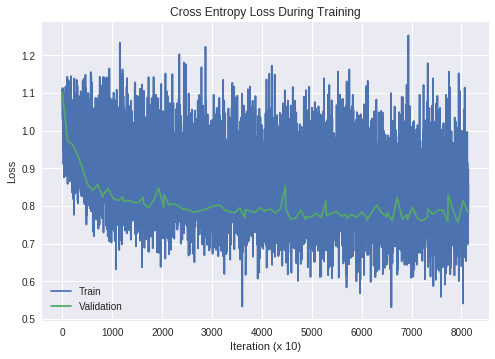

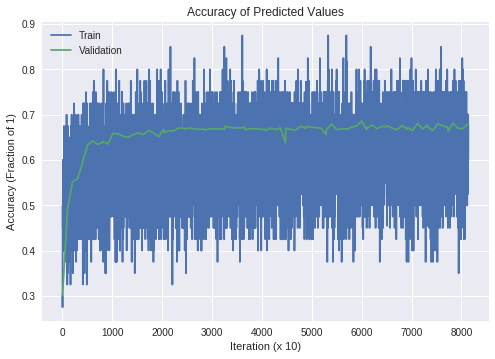

In [ ]:
# SELU with Dropout

## Non-Augmented Data, Angle Dataset

In [ ]:
# Non Augmented Data \/ \/ \/ \/ 

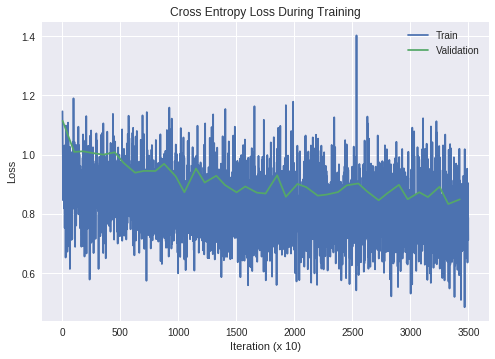

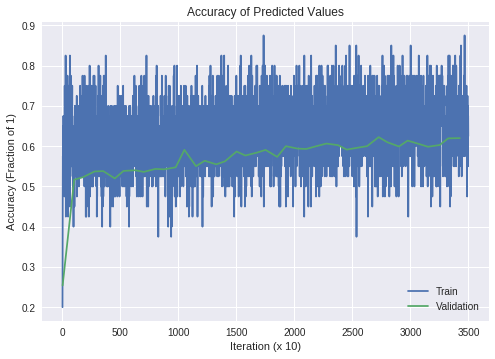

In [ ]:
# Using CELU with dropout

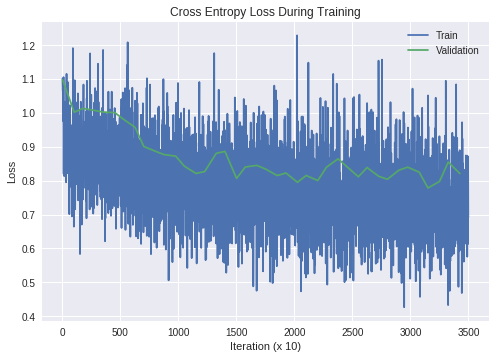

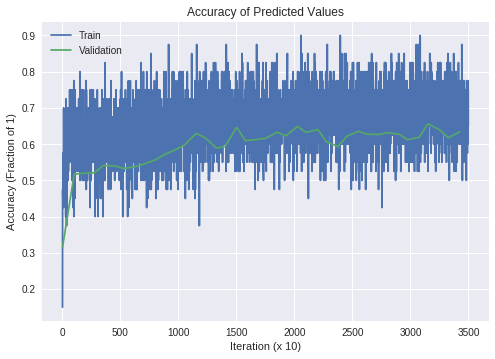

In [ ]:
# using ReLU activation function; without dropout

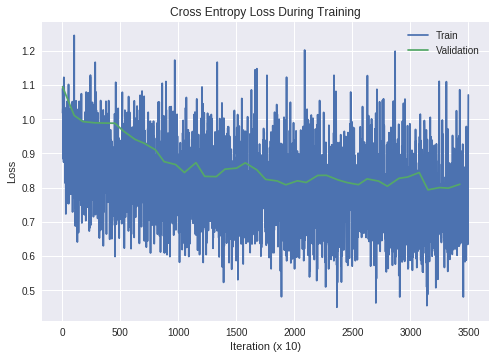

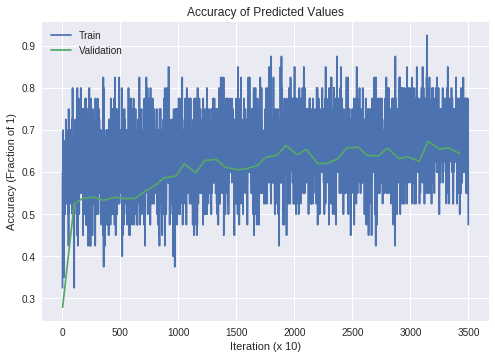

In [ ]:
# using ReLU activation function; with dropout

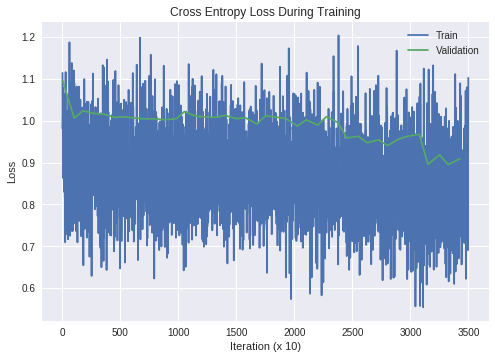

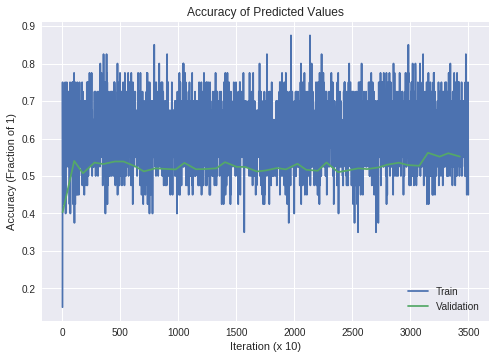

In [ ]:
# Using Tanh activation function with dropout

## Number of parameters in the model

In [ ]:
# model = SmallConvNetwork(train_dataset)
# print(model.eval())
def count_parameters(model):
    total_param = 0
    for name, param in model.named_parameters():
        if param.requires_grad:
            num_param = np.prod(param.size())
#             if param.dim() > 1:
#                 print(name, ':', 'x'.join(str(x) for x in list(param.size())), '=', num_param)
#             else:
#                 print(name, ':', num_param)
            total_param += num_param
    print("Total # of parameters: ",total_param)
    return total_param

count_parameters(model)

In [ ]:
## Mean validation accuracy across 100 epochs (for the model plotted below, not above)
a, b = zip(*accuracy_v)
print(np.mean(b))

## Visualize misclassified data chunks

In [ ]:
## This cell will gather the predictions of a trained model and allow you to visualize those which were misclassified

model = model.cuda()
# initialize a number of lists
accuracy_vis = [] 
bad_x = [] # list the inputs (angle data) of a misclassified chunk
user_title = [] # Tie the user type back to the data
all_user_title = [] # list all the user types

user_type = ['Male', 'Female', 'Child']
loader = train_loader

for chunk_num, (x_vis, y_truth_vis) in enumerate(loader):
  x_vis, y_truth_vis = x_vis.cuda(), y_truth_vis.cuda()
  y_hat_vis = model(x_vis)
  acc_vis = (torch.softmax(y_hat_vis, 1).argmax(1).unsqueeze(1) == y_truth_vis).float()
  location = []
  
  for k in range(acc_vis.size(0)):
    all_user_title.append(user_type[np.int(y_truth_vis[k])])
    
    if np.int(acc_vis[[k]])== 0: # if misclassifed
      location.append(k) # record locations within batch
      bad_x.append(x_vis[k, 0, :]) # pull out data related to misclassified chunks
      user_title.append(user_type[np.int(y_truth_vis[k])]) # collect correct classification for misclassified chunks 
      
  accuracy_vis.append(acc_vis.mean())

In [ ]:
from collections import Counter
counts = Counter(user_title)
# male_percents = ['Males fraction misclassified = ', counts['Male']/(counts['Child']+counts['Male']+counts['Female'])]
# female_percents = ['Females fraction misclassified = ', counts['Female']/(counts['Child']+counts['Male']+counts['Female'])]
# child_percents = ['Children fraction misclassified = ', counts['Child']/(counts['Child']+counts['Male']+counts['Female'])]


all_counts = Counter(all_user_title) # count number of each user type
# get the fraction of males misclassified/all males
male_percents = ['Males fraction misclassified = ', counts['Male']/all_counts['Male']]
# get the fraction of females misclassified/all females
female_percents = ['Females fraction misclassified = ', counts['Female']/all_counts['Female']]
# get the fraction of children misclassified/all children
# child_percents = ['Children fraction misclassified = ', counts['Child']/all_counts['Child']]
# get the fractions of each user type/all users
m_percents = ['Male fraction = ', all_counts['Male']/(all_counts['Child']+all_counts['Male']+all_counts['Female'])]
f_percents = ['Female fraction = ', all_counts['Female']/(all_counts['Child']+all_counts['Male']+all_counts['Female'])]
# c_percents = ['Child fraction = ', all_counts['Child']/(all_counts['Child']+all_counts['Male']+all_counts['Female'])]
print("Number of misclassified: ",counts)
print(male_percents)
print(female_percents)
# print(child_percents)
print("Total number of each user type: ",all_counts)
print(m_percents, '\n', f_percents)
# print(m_percents, '\n', f_percents, '\n', c_percents)

Number of misclassified:  Counter({'Female': 58703, 'Male': 15984})
['Males fraction misclassified = ', 0.3595303432453102]
['Females fraction misclassified = ', 0.8684775050670928]
Total number of each user type:  Counter({'Female': 67593, 'Male': 44458})
['Male fraction = ', 0.3967657584492776] 
 ['Female fraction = ', 0.6032342415507225]


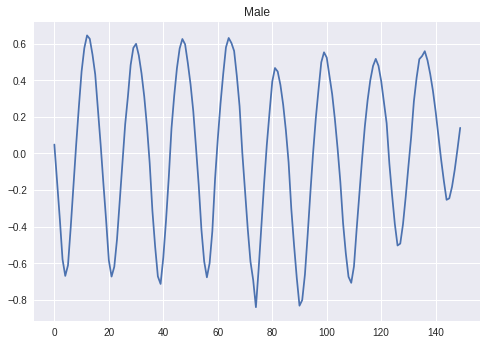

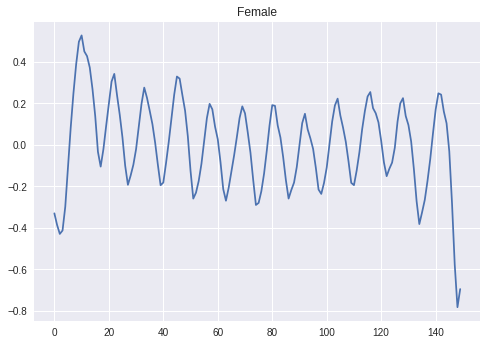

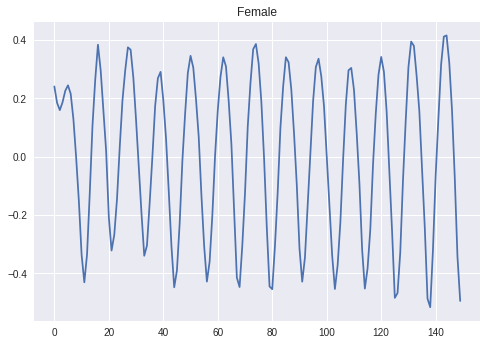

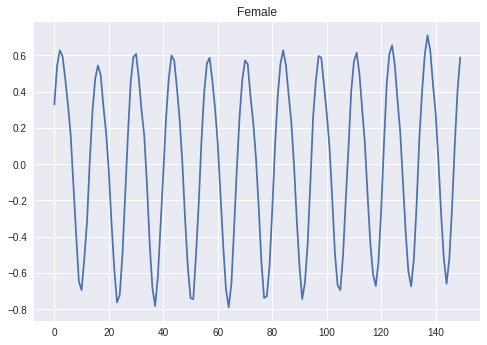

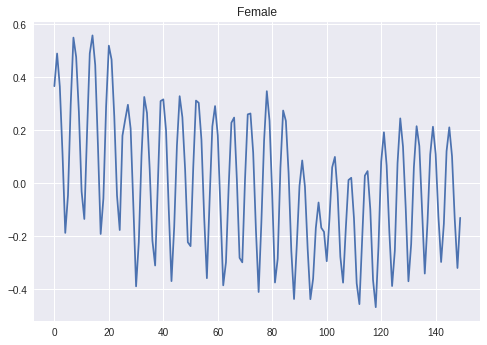

...

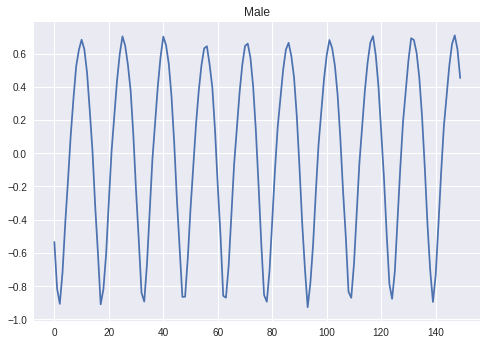

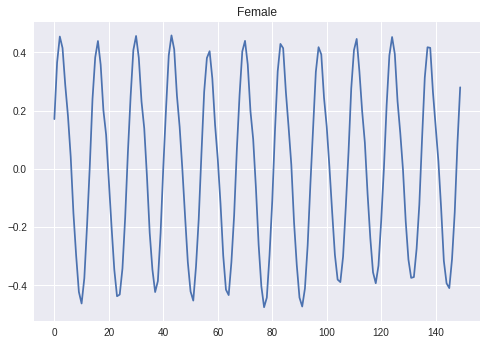

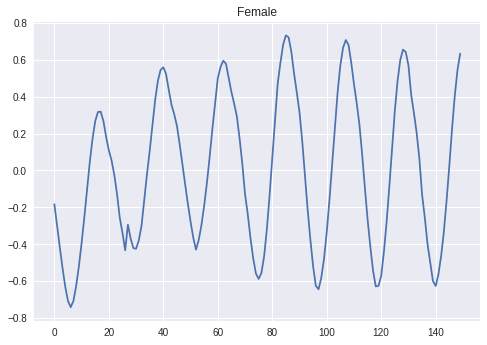

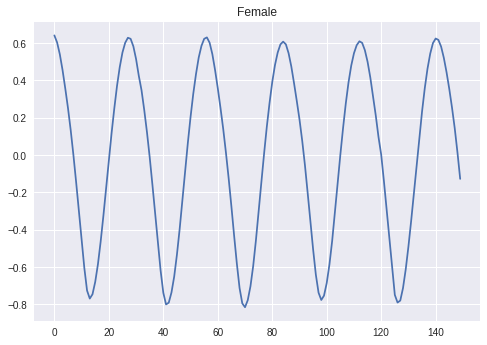

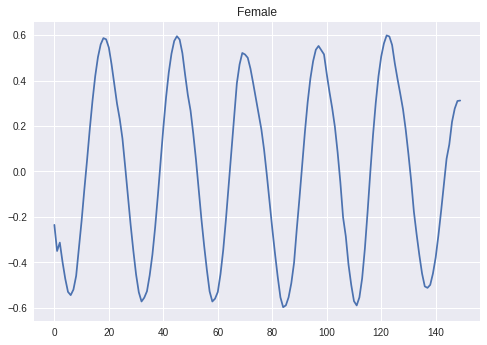

In [ ]:
# plot some of the chunks which were misclassified
for j in range(100):
  plt.plot(np.array(bad_x[j].cpu()))
  plt.title(user_title[j])
  plt.show()

# Old Stuff

In [ ]:
# Decaying learning rate per epoch
def learning_rate(epoch):
  rate = 0.069 # half life of 10 epochs, and will reach about 1e-5 by 100 epochs; for a half life of 25 epochs and 1e-4 by 100 epochs, try rate = 0.028; for half life of 5 epochs, try rate = .139
  lr = 0.001*np.exp(-rate*epoch)
  print(lr)
  return lr

In [ ]:
# model = ConvNetwork(train_dataset)
# model = model.cuda()
# objective = nn.CrossEntropyLoss()
# # objective = nn.MSELoss()
# optimizer = optim.Adam(model.parameters(), lr = learning_rate)#, betas=(beta1, beta2))

# losses = []
# accuracy = []

# total_men_act   = 0
# total_women_act = 0
# total_child_act = 0
# total_total_act = 0
# total_men_est   = 0
# total_women_est = 0
# total_child_est = 0
# total_total_est = 0

loop = tqdm(total=len(train_loader) * epochs, position=0)

for epoch in range(epochs):
#   print('Epoch',epoch)
  for batch_num, (x, y_truth) in enumerate(train_loader):
    x, y_truth = x.cuda(async=True), y_truth.cuda(async=True)
    
    optimizer.zero_grad()
    
    y_hat = model(x)
    loss = objective(y_hat, y_truth.squeeze(1))
#     pdb.set_trace()
    acc = (torch.softmax(y_hat, dim=1).argmax(1).unsqueeze(1) == y_truth).float().mean()

    # We need to calculate the accuracy based off the validation set here
    
    # Update progress bar and display loss/accuracy
    loop.set_description('loss:{:.4f}, acc: {:.4f}'.format(loss.item(),acc.item()))
    loop.update(1)    
    
    save_every = 10
    if batch_num % save_every == 0:
        
      losses.append(loss)
      accuracy.append(acc)
#       print(torch.softmax(y_hat, 1).argmax(1))
#       print('\n')

      batch_l, _ = y_truth.size()
      num_men_act   = int(torch.sum((y_truth == torch.from_numpy(np.full((batch_l,1),0)).cuda())))
      num_women_act = int(torch.sum((y_truth == torch.from_numpy(np.full((batch_l,1),1)).cuda())))
      num_child_act = int(torch.sum((y_truth == torch.from_numpy(np.full((batch_l,1),2)).cuda())))
      total_act = num_men_act + num_women_act + num_child_act
#       print('Batch act: M={:.2f}, W={:.2f}, C={:.2f}'.format(num_men_act/total_act,num_women_act/total_act,num_child_act/total_act))
      
      total_men_act   = total_men_act + num_men_act
      total_women_act = total_women_act + num_women_act
      total_child_act = total_child_act + num_child_act
      total_total_act = total_total_act + num_men_act + num_women_act + num_child_act
#       print('Cumulative act: M={:.2f}, W={:.2f}, C={:.2f}'.format(total_men_act/total_total_act,total_women_act/total_total_act,total_child_act/total_total_act))
      
      num_men_est = int(torch.sum((torch.softmax(y_hat, 1).argmax(1) == torch.from_numpy(np.full((batch_l,1),0)).cuda())))
      num_women_est = int(torch.sum((torch.softmax(y_hat, 1).argmax(1) == torch.from_numpy(np.full((batch_l,1),1)).cuda())))
      num_child_est = int(torch.sum((torch.softmax(y_hat, 1).argmax(1) == torch.from_numpy(np.full((batch_l,1),2)).cuda())))
      total_est = num_men_est + num_women_est + num_child_est
#       print('Batch pred: M={:.2f}, W={:.2f}, C={:.2f}'.format(num_men_est/total_est,num_women_est/total_est,num_child_est/total_est))
      
      total_men_est = total_men_est + num_men_est
      total_women_est = total_women_est + num_women_est
      total_child_est = total_child_est + num_child_est
      total_total_est = total_total_est + num_men_est + num_women_est + num_child_est
#       print('Cumulative pred: M={:.2f}, W={:.2f}, C={:.2f}'.format(total_men_est/total_total_est,total_women_est/total_total_est,total_child_est/total_total_est))

      print('Batch Act/Est: M={:.2f}/{:.2f}, W={:.2f}/{:.2f}, C={:.2f}/{:.2f}'.format(num_men_act/total_act,num_men_est/total_est,num_women_act/total_act,num_women_est/total_est,num_child_act/total_act,num_child_est/total_est))
      print('Cumul Act/Est: M={:.2f}/{:.2f}, W={:.2f}/{:.2f}, C={:.2f}/{:.2f}'.format(total_men_act/total_total_act,total_men_est/total_total_est,total_women_act/total_total_act,total_women_est/total_total_est,total_child_act/total_total_act,total_child_est/total_total_est))
      
#       if epoch % 10 == 0:
#         pdb.set_trace()

    
    loss.backward()
    optimizer.step()
#   pdb.set_trace() 


  
loop.close()

To do:

*   Find out what the proportion of each type is to see if we guessed randomly each time if the accuracy would be 33%
*   Try to add model capacity and number of layers
* See what percent of each type of user is in the datasets
* See if the model is just guessing the most common of types every time

In [ ]:
# Modify the data: This is the original place I coded up what happened in the dataset class
# This is actually in AngleDataset class now

#   def process_data(self, data, index):

# define chunk length
# chunk_length = int(hz * self.chunk_seconds)
chunk_length = 75 # Arbitrary, but there are between about 15-25 samples per second

# data augmentation options: Start with 1 horiz_sampling and then increase from there if needed
horiz_samplings = 1 # number of times to sample horizontally from the same dataset
# vert_samplings = 0 # number of vertical samplings; No longer needed due to normalization
# vert_shift = 3 # degrees of shift when augmenting the data; No longer needed due to normalization
slope_samplings = 0 # number of slope augmentations
slopes = [-1, 1]


data_out_m = np.zeros((1,chunk_length,3),dtype=float) # Initialize master data out (x)
labels_m = np.zeros((1,1),dtype=int)# Initialize labels out (y)

# Create a for loop that gets the data for one user then does all the magic for it:
# for i in train_indices:
# #   print('User:',i)
#   single_user = train_data[np.where(train_data[:,0] == i)] # get the data for one user
  
for i in valid_indices:
#   print('User:',i)
  single_user = valid_data[np.where(valid_data[:,0] == i)] # get the data for one user
  
  
  len_user, cc = single_user.shape
#   print(len_user)
  if len_user <= chunk_length: # skip users whose total lengths are less than the chunk length
    continue # go to the next iteration
    
  # SKIP FOR NOW: Clean up data by removing leading and ending portions with no change
  single_user = single_user # Will assign the cleaned up data here
  
  # Calculate total pump time of user for use later as second channel
  duration_seconds = single_user[-1,1] - single_user[0,1]
  duration_ind, skip = single_user.shape
#   print(duration)
#   print(duration_ind)

  num_chunks = int(duration_ind/chunk_length) # Starting from beginning of array, get chunks of size chunk_length
#   print(num_chunks)
  
  # Create and combine chunks
  new_chunks = np.zeros([1, chunk_length, 2],dtype=float) # initialize array for concatenation in the loop
  for j in range(num_chunks):
    new_chunk = single_user[np.newaxis,0+j*chunk_length:chunk_length+j*chunk_length, 2:4]
    new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0
    new_chunks = np.vstack((new_chunks, new_chunk))
#     print(new_chunk.shape)
  new_chunks = np.delete(new_chunks, 0, 0) # delete initialization row
#   print('new',new_chunk.shape)

  # Also augment by getting random chunks
#   random_sets = 3
#   for j in range(random_sets * num_chunks):
#     start_ind = np.random.randint(0,duration_ind - chunk_length)
#     new_chunk = single_user[np.newaxis, start_ind:start_ind + chunk_length, 2:4]
#     new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0
#     new_chunks = np.vstack((new_chunks, new_chunk))
  
  # Augment by shifting vertically (DO NOT DO THIS; REPLACED WITH NORMALIZING above)
  
  # Augment by adding drift based on some condition to make sure we don't add drift to segments that already have drift
  
  
  # Combine data
  current_num_chunks, a, b = new_chunks.shape
  dur_array = np.full((current_num_chunks, chunk_length, 1), duration_seconds) # creating channel for the duration
  new_chunks = np.concatenate((new_chunks,dur_array), axis = 2) # Concatenate on the duration channel
  data_out_m = np.vstack((data_out_m, new_chunks )) # concatenate on all chunks from that user
#   print(data_out_m.shape)
  
  # create labels
  labels_m = np.vstack((labels_m, np.full((current_num_chunks, 1), single_user[0,4])))
  
data_out_m = np.delete(data_out_m, 0, 0) # delete initialization row
labels_m = np.delete(labels_m,0,0) # delete initialization row

# Normalize data for better gradients
# Normalizing params: We want to choose these such that after dividing the original values by this, we get a value between -1 and 1 or 0 and 1 (on the 1 scale)
amp_norm = 30 # 30 was chosen because we want the max value of this to be approx. 1 and the max amplitude is 60 degrees and half of that is 30;
dt_norm = 80 # The max dt is about 80 ms
dur_norm = 600 # the max duration is about 600 seconds

data_out_m[:,:,0] = data_out_m[:,:,0]/amp_norm
data_out_m[:,:,1] = data_out_m[:,:,1]/dt_norm
data_out_m[:,:,2] = data_out_m[:,:,2]/dur_norm
print(data_out_m.shape)
print(labels_m.shape)
print(np.mean(data_out_m[:,:,0]))

# Output: x, y tuple; x = Data arrays of chunks (i.e. 600 users *~10 chunks/user) x 100(chunk len)x3 (angle, dt, duration) arrays; y = labels = Separate array/list of 600 (users) x 1 (User Type)

# return data_out_m, labels_out_m # x, y ; x = 5000 x 100 x 3 ; y = 5000 x 1

# data_out, label_out = process_data(train_data,train_indices)

(3088, 75, 3)
(3088, 1)
2.0881396784400614e-18


In [ ]:
# This is the original AngleDataset class before cleaning up prior to creating StrokeDataset class
class AngleDataset(Dataset):
  def __init__(self, data_in, indices):
    super(AngleDataset, self).__init__()
    
    self.data_out, self.label_out = self.process_data(data_in, indices)
    
  def __getitem__(self,i):
    x = self.data_out[i]
    y = self.label_out[i]
#     return x, y.float() # Use for MSELoss
    return x, y
    
  def __len__(self):
    return len(self.label_out)
  
  def process_data(self, data, index):
    chunk_length = 150 # was 100 # Arbitrary, but there are between about 15-25 samples per second
    big_jump = []
    
    # data augmentation options: Start with 1 horiz_sampling and then increase from there if needed
    horiz_samplings = 1 # number of times to sample horizontally from the same dataset
    # vert_samplings = 0 # number of vertical samplings; No longer needed due to normalization
    # vert_shift = 3 # degrees of shift when augmenting the data; No longer needed due to normalization

    data_out_m = np.zeros((1,chunk_length,3),dtype=float) # Initialize master data out (x)
    labels_m = np.zeros((1,1),dtype=int)# Initialize labels out (y)

    # Create a for loop that gets the data for one user then does all the magic for it:
    for i in index:
      #   print('User:',i)
      single_user = data[np.where(data[:,0] == i)] # get the data for one user

      len_user, cc = single_user.shape
      #   print(len_user)
      if len_user <= chunk_length: # skip users whose total lengths are less than the chunk length
        continue # go to the next iteration

      # SKIP FOR NOW: Clean up data by removing leading and ending portions with no change
      #       single_user = single_user # Will assign the cleaned up data here

      # Calculate total pump time of user for use later as second channel
      duration_seconds = single_user[-1,1] - single_user[0,1]
      duration_ind, skip = single_user.shape
      #   print(duration)
      #   print(duration_ind)

      num_chunks = int(duration_ind/chunk_length) # Starting from beginning of array, get chunks of size chunk_length
      #   print(num_chunks)

      # Create and combine chunks
      new_chunks = np.zeros([1, chunk_length, 2],dtype=float) # initialize array for concatenation in the loop
      for j in range(num_chunks):
        new_chunk = single_user[np.newaxis,0+j*chunk_length:chunk_length+j*chunk_length, 2:4]
        new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0
        new_chunks = np.vstack((new_chunks, new_chunk))
      #     print(new_chunk.shape)
      new_chunks = np.delete(new_chunks, 0, 0) # delete initialization row
      #   print('new',new_chunk.shape)

      # Also augment by getting random chunks
      random_sets = 6 # changed from 3 to 10 for only Day 1 data; improved acc from 50% to 100%
      for j in range(random_sets * num_chunks):
        start_ind = np.random.randint(0,duration_ind - chunk_length)
        new_chunk = single_user[np.newaxis, start_ind:start_ind + chunk_length, 2:4]
        new_chunk[0,:,0] = new_chunk[0,:,0] - np.mean(new_chunk[0,:,0]) # Normalizing each chunk to have a mean of 0
        
        # this loop removes any chunks with large (>65) jumps 
        for k in range(new_chunk.shape[0]):
#           counter_chunks += 1
          if max(new_chunk[k, :, 0]) - min(new_chunk[k, :, 0]) < 65:
#             counter_recorded += 1
#             big_jump.append(new_chunk[k, :, 0]) # each chunk, all the angle data
            new_chunks = np.vstack((new_chunks, new_chunk))
        
#       for i in range(min(len(big_jump), 10)):
#         plt.plot(big_jump[i])
#         plt.show()
      
      # Augment by shifting vertically (DO NOT DO THIS; REPLACED WITH NORMALIZING above)

      # Augment by adding drift based on some condition to make sure we don't add drift to segments that already have drift
#       slope_samplings = 0 # number of slope augmentations
#       slopes = [-1, 1]

      # Combine data
      current_num_chunks, a, b = new_chunks.shape
      dur_array = np.full((current_num_chunks, chunk_length, 1), duration_seconds) # creating channel for the duration
      new_chunks = np.concatenate((new_chunks,dur_array), axis = 2) # Concatenate on the duration channel
      data_out_m = np.vstack((data_out_m, new_chunks )) # concatenate on all chunks from that user
    #   print(data_out_m.shape)

      # create labels
      labels_m = np.vstack((labels_m, np.full((current_num_chunks, 1), single_user[0,4])))
#     pdb.set_trace()
    data_out_m = np.delete(data_out_m, 0, 0) # delete initialization row
    labels_out_m = np.delete(labels_m,0,0) # delete initialization row
    labels_out_m = labels_out_m - 1 # reassign M/W/C to [0, 1, 2] so I can use cross entropy loss

    # Normalize data for better gradients
    # Normalizing params: We want to choose these such that after dividing the original values by this, we get a value between -1 and 1 or 0 and 1 (on the 1 scale)
    amp_norm = 30 # 30 was chosen because we want the max value of this to be approx. 1 and the max amplitude is 60 degrees and half of that is 30;
    dt_norm = 80 # The max dt is about 80 ms
    dur_norm = 600 # the max duration is about 600 seconds

    data_out_m[:,:,0] = data_out_m[:,:,0]/amp_norm
    data_out_m[:,:,1] = data_out_m[:,:,1]/dt_norm
    data_out_m[:,:,2] = data_out_m[:,:,2]/dur_norm
#     print('Data size = ',data_out_m.shape)
#     print('Classification size = ',labels_out_m.shape)
#     print('Mean of all amplitudes (should be ~0 if normalization worked) = ', np.mean(data_out_m[:,:,0]))
    
    # convert final data from numpy arrays to tensors
    data_out_m = torch.Tensor(data_out_m)
    labels_out_m = torch.Tensor(labels_out_m).long()
#     print("data type = ", data_out_m.type())
#     print("label type = ", labels_out_m.type())
    data_out_m = data_out_m.permute(0, 2, 1)
#     print("permuted = ", data_out_m[:,0:2,:].size())


# Output: x, y tuple; x = Data arrays of chunks (i.e. 600 users *~10 chunks/user) x 100(chunk len)x3 (angle, dt, duration) arrays; y = labels = Separate array/list of 600 (users) x 1 (User Type)   
    return data_out_m[:,0:2,:], labels_out_m # x, y ; x = 5000 x 100 x 3 ; y = 5000 x 1

In [ ]:
## Uploading the file is just a way to get the CSVs in without mounting the Drive
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

 

## Plotly (Doesn't work well)

In [ ]:
# Plotly
# # Create traces
# trace0 = go.Scatter(
#     x = random_x,
#     y = random_y0,
#     mode = 'markers',
#     name = 'markers'
# )
# trace1 = go.Scatter(
#     x = random_x,
#     y = random_y1,
#     mode = 'lines+markers',
#     name = 'lines+markers'
# )
# trace2 = go.Scattergl(
#     x = raw_data1[0:250000,0],
#     y = raw_data1[0:250000,3],
# #     mode = 'lines',
# #     name = 'lines'
#     mode = 'lines+markers',
#     marker = dict(
#         color = '#FFBAD2',
#         line = dict(width = 1))
# )

# # data = [trace0, trace1, trace2]
# data = [trace2]
# pty.iplot(data, filename='scatter-mode')

# N = 100000
# trace = go.Scattergl(
#     x = np.random.randn(N),
#     y = np.random.randn(N),
#     mode = 'markers',
#     marker = dict(
#         color = '#FFBAD2',
#         line = dict(width = 1)
#     )
# )
# data = [trace2]
# py.iplot(data, filename='compare_webgl')

In [ ]:
loss = nn.CrossEntropyLoss()
input = torch.randn(3, 5, requires_grad=True)
target = torch.empty(3, dtype=torch.long).random_(5)
print(input.shape,target.shape)
output = loss(input, target)
output.backward()